<a href="https://colab.research.google.com/github/IlDannylI/FinalProject_AI/blob/main/final_project_team8.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

In [ ]:
#written by Danny
#ATTACHING DRIVE
from google.colab import drive
drive.mount('/content/drive')


Mounted at /content/drive


In [ ]:
#written by Danny
#LOADING ALL NECCESSARY LIBRARIES
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
import os
import torch
from torchvision import datasets, transforms
from torch.utils.data import Dataset, DataLoader
from sklearn.model_selection import train_test_split

import torch.nn as nn
import torchvision.models as models
import torch.optim as optim
import matplotlib.pyplot as plt
from tqdm import tqdm
from re import L
import os
from PIL import Image
import random
import cv2
from sklearn.metrics import classification_report, jaccard_score
import torchvision.transforms.functional as TF


In [ ]:
#written by Danny
#LOADING DATASET & PREPROCESSING
dataset_path = "/content/drive/MyDrive/Dataset_BUSI_with_GT"


# Empty Lists to load the images & masks
images = []
labels = []



for folder in os.listdir(dataset_path):
  for file in os.listdir(os.path.join(dataset_path, folder)):
    if file.endswith(".png") and "_mask" not in file: #<- Checks for the only the ".png" file and not the "_mask" image
      images_path = os.path.join(dataset_path, folder, file) #<-sets the image path &
      mask_path = os.path.join(dataset_path, folder, file.replace(".png", "_mask.png")) #<- sets the mask path
      if os.path.exists(mask_path): #<- Checks if the mask path exists
       images.append(images_path)
       labels.append(mask_path)

780
780


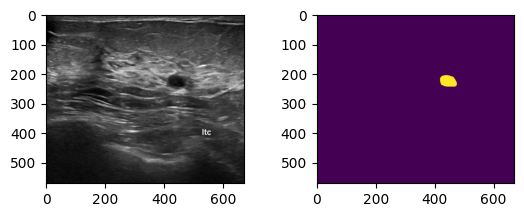

In [ ]:
#written by Danny
#Checking length for both image & mask lists
print(len(images))
print(len(labels))

#Verify if image & masks are a pair
plt.subplot(2, 2, 1)
img = plt.imread(images[200])
plt.imshow(img)
plt.subplot(2, 2, 2)
mask = plt.imread(labels[200])
plt.imshow(mask)

In [ ]:
#written by Danny  `
#Split Into Training & Testing

image_train, image_test, mask_train, mask_test = train_test_split(images, labels, test_size=0.2, random_state=42)


In [ ]:
#written by Danny

#Creating the first CustomDataset Class

class CustomDataset(Dataset):
    def __init__(self, images, labels, transform=None):
        self.images = images
        self.labels = labels
        self.transform = transform

    def __len__(self):
        return len(self.images)

    def __getitem__(self, idx):
        image_path = self.images[idx]
        label_path = self.labels[idx]

        image = Image.open(image_path).convert("RGB")

        label = Image.open(label_path).convert("L")

        if self.transform:
            image = self.transform(image)
            label = self.transform(label)

            max_value = label.max()
            label = label / max_value
            label = label.type(torch.LongTensor)
            label = (label > 0.5).long()
            label = label.squeeze(0)

        return image, label

#Resize Images
transform = transforms.Compose([
    transforms.Resize((224, 224)),
    transforms.ToTensor()])



train_dataset = CustomDataset(image_train, mask_train, transform=transform)
test_dataset = CustomDataset(image_test, mask_test, transform=transform)

print(len(train_dataset))
print(len(test_dataset))


train_loader = DataLoader(train_dataset, batch_size=16, shuffle=True, num_workers=2)
test_loader = DataLoader(test_dataset, batch_size=16, shuffle=False, num_workers=2)

624
156


In [ ]:
#CREATING the first MODEL
#written by Danny
device = torch.device("cuda" if torch.cuda.is_available() else "cpu")
model = models.segmentation.deeplabv3_resnet50(pretrained=True)
model.classifier[4] = nn.Conv2d(256, 2, kernel_size=(1, 1), stride=(1, 1))
model = model.to(device)


criterion = nn.CrossEntropyLoss()
optimizer = torch.optim.Adam(model.parameters(), lr=0.0001)

/usr/local/lib/python3.11/dist-packages/torchvision/models/_utils.py:208: UserWarning: The parameter 'pretrained' is deprecated since 0.13 and may be removed in the future, please use 'weights' instead.
  warnings.warn(
/usr/local/lib/python3.11/dist-packages/torchvision/models/_utils.py:223: UserWarning: Arguments other than a weight enum or `None` for 'weights' are deprecated since 0.13 and may be removed in the future. The current behavior is equivalent to passing `weights=DeepLabV3_ResNet50_Weights.COCO_WITH_VOC_LABELS_V1`. You can also use `weights=DeepLabV3_ResNet50_Weights.DEFAULT` to get the most up-to-date weights.
  warnings.warn(msg)
Downloading: "https://download.pytorch.org/models/deeplabv3_resnet50_coco-cd0a2569.pth" to /root/.cache/torch/hub/checkpoints/deeplabv3_resnet50_coco-cd0a2569.pth
100%|██████████| 161M/161M [00:01<00:00, 168MB/s]


Testing: 100%|██████████| 10/10 [01:01<00:00,  6.16s/it]


Epoch 1, Train Loss: 0.5236518077361279, Test Loss: 0.36054382622241976


Testing: 100%|██████████| 10/10 [00:03<00:00,  2.54it/s]


Epoch 2, Train Loss: 0.23596432422980285, Test Loss: 0.21351222842931747


Testing: 100%|██████████| 10/10 [00:04<00:00,  2.44it/s]


Epoch 3, Train Loss: 0.163727417970315, Test Loss: 0.17305431813001632


Testing: 100%|██████████| 10/10 [00:04<00:00,  2.06it/s]


Epoch 4, Train Loss: 0.12499739573552059, Test Loss: 0.15747578889131547


Testing: 100%|██████████| 10/10 [00:04<00:00,  2.39it/s]


Epoch 5, Train Loss: 0.09914082747239333, Test Loss: 0.14284848421812057
Finished Training


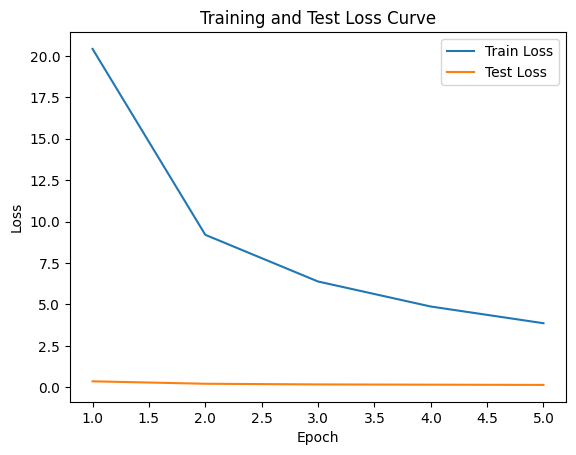

In [ ]:
#Training & Testing the first Model
#written by Danny
num_epochs = 5
train_losses = []
test_losses = []

for epoch in range(num_epochs):
  model.train()
  train_loss = 0.0
  for images, labels in tqdm(train_loader, desc=f"Epoch {epoch+1}/{num_epochs}"):
    images, labels = images.to(device), labels.to(device)
    optimizer.zero_grad()
    outputs = model(images)
    loss = criterion(outputs['out'], labels)
    loss.backward()
    optimizer.step()
    train_loss += loss.item()

  epoch_training_loss = train_loss / len(train_loader)
  train_losses.append(train_loss)
  model.eval()
  test_loss = 0.0
  correct = 0
  total = 0
  with torch.no_grad():
    for images, labels in tqdm(test_loader, desc="Testing"):
      images, labels = images.to(device), labels.to(device)
      outputs = model(images)
      loss = criterion(outputs['out'], labels)
      test_loss += loss.item()
      _, predicted = torch.max(outputs['out'], 1)
      total += labels.size(0)
      correct += (predicted == labels).sum().item()

  epoch_test_loss = test_loss / len(test_loader)
  test_losses.append(epoch_test_loss)
  print(f"Epoch {epoch+1}, Train Loss: {epoch_training_loss}, Test Loss: {epoch_test_loss}")

print('Finished Training')

plt.plot(range(1, num_epochs+1), train_losses, label='Train Loss')
plt.plot(range(1, num_epochs+1), test_losses, label='Test Loss')
plt.xlabel('Epoch')
plt.ylabel('Loss')
plt.title('Training and Test Loss Curve')
plt.legend()
plt.show()


In [ ]:

# Save the first model
torch.save(model, "model.pth")
model = torch.load("model.pth", weights_only=False)

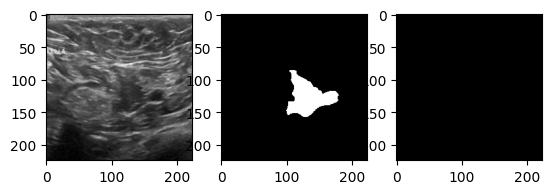

IOU: 0.0


/usr/local/lib/python3.11/dist-packages/sklearn/metrics/_classification.py:1565: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/usr/local/lib/python3.11/dist-packages/sklearn/metrics/_classification.py:1565: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/usr/local/lib/python3.11/dist-packages/sklearn/metrics/_classification.py:1565: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))


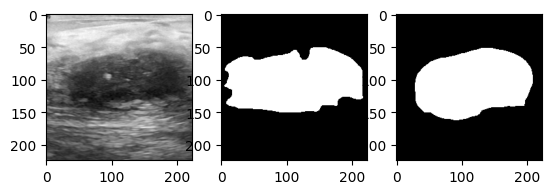

IOU: 0.7757905359946177


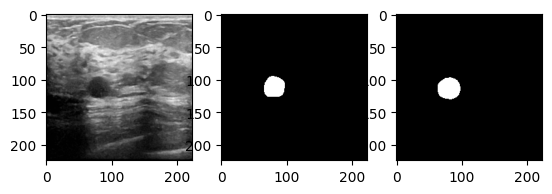

IOU: 0.8096676737160121


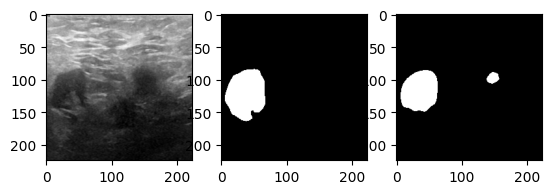

IOU: 0.726611487333835


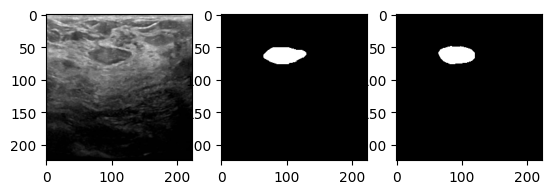

IOU: 0.826783114992722


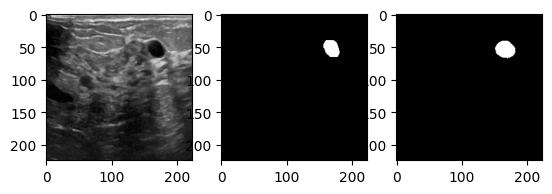

IOU: 0.7233082706766917


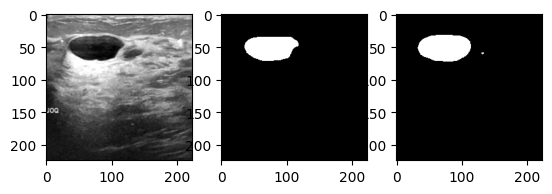

IOU: 0.8629695885509839


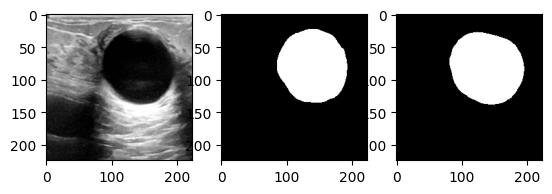

IOU: 0.8963337547408344


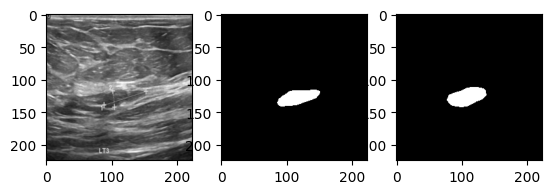

IOU: 0.59251968503937


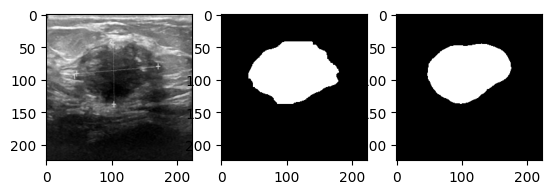

IOU: 0.8619052533801218


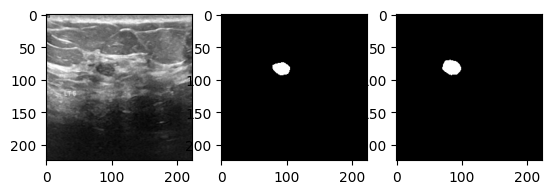

IOU: 0.46955128205128205


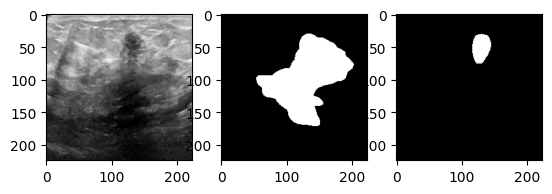

IOU: 0.09131018607327834


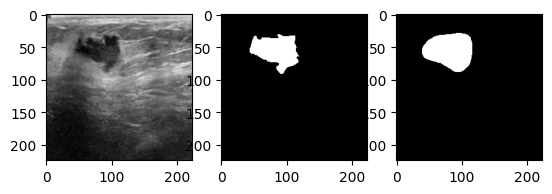

IOU: 0.7721194879089616


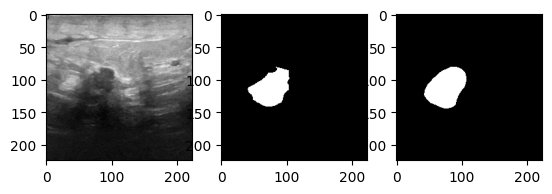

IOU: 0.8283839779005525


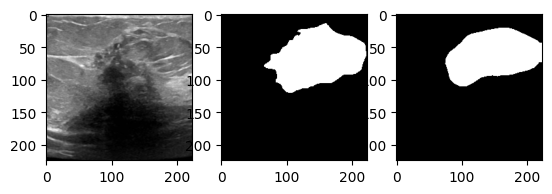

IOU: 0.8115470435105987


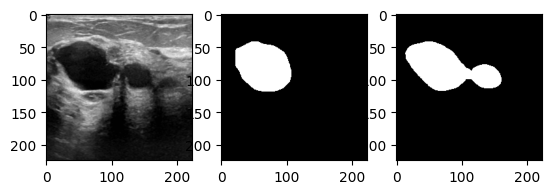

IOU: 0.684739833843463


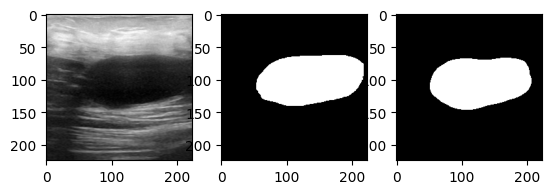

IOU: 0.8438891412994094


/usr/local/lib/python3.11/dist-packages/torch/_tensor.py:1077: RuntimeWarning: invalid value encountered in multiply
  return self.reciprocal() * other
/usr/local/lib/python3.11/dist-packages/torch/_tensor.py:1196: RuntimeWarning: invalid value encountered in cast
  return self.numpy().astype(dtype, copy=False)


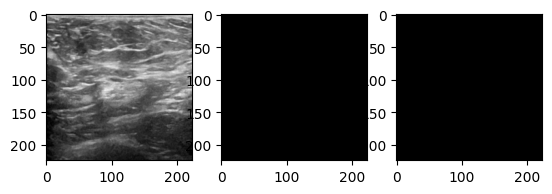

IOU: 1.0


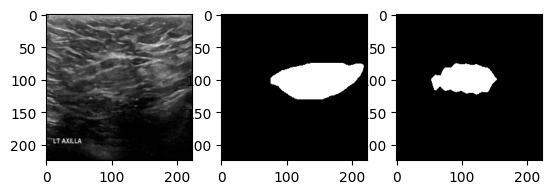

IOU: 0.355877616747182


/usr/local/lib/python3.11/dist-packages/torch/_tensor.py:1077: RuntimeWarning: invalid value encountered in multiply
  return self.reciprocal() * other
/usr/local/lib/python3.11/dist-packages/torch/_tensor.py:1196: RuntimeWarning: invalid value encountered in cast
  return self.numpy().astype(dtype, copy=False)


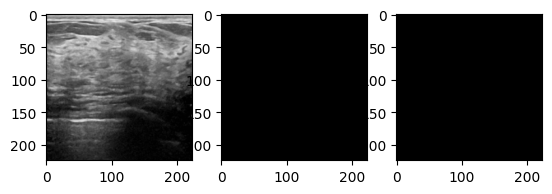

IOU: 1.0


/usr/local/lib/python3.11/dist-packages/torch/_tensor.py:1077: RuntimeWarning: invalid value encountered in multiply
  return self.reciprocal() * other
/usr/local/lib/python3.11/dist-packages/torch/_tensor.py:1196: RuntimeWarning: invalid value encountered in cast
  return self.numpy().astype(dtype, copy=False)


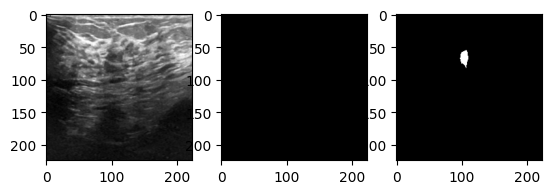

IOU: 0.0


/usr/local/lib/python3.11/dist-packages/sklearn/metrics/_classification.py:1565: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/usr/local/lib/python3.11/dist-packages/sklearn/metrics/_classification.py:1565: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/usr/local/lib/python3.11/dist-packages/sklearn/metrics/_classification.py:1565: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))


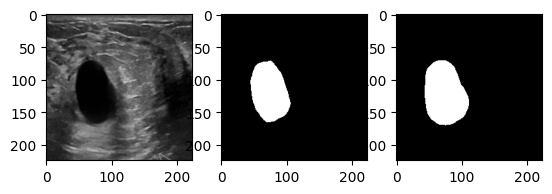

IOU: 0.8172686884295924


/usr/local/lib/python3.11/dist-packages/torch/_tensor.py:1077: RuntimeWarning: invalid value encountered in multiply
  return self.reciprocal() * other
/usr/local/lib/python3.11/dist-packages/torch/_tensor.py:1196: RuntimeWarning: invalid value encountered in cast
  return self.numpy().astype(dtype, copy=False)


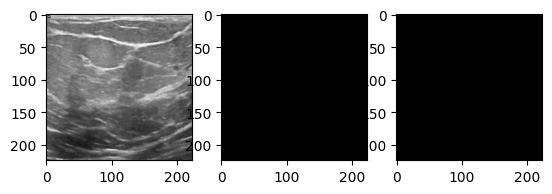

IOU: 1.0


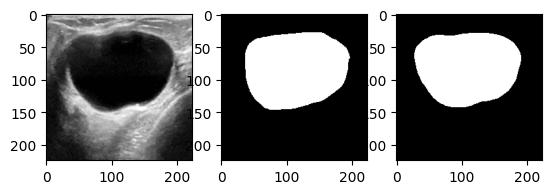

IOU: 0.8957337142147426


/usr/local/lib/python3.11/dist-packages/torch/_tensor.py:1077: RuntimeWarning: invalid value encountered in multiply
  return self.reciprocal() * other
/usr/local/lib/python3.11/dist-packages/torch/_tensor.py:1196: RuntimeWarning: invalid value encountered in cast
  return self.numpy().astype(dtype, copy=False)


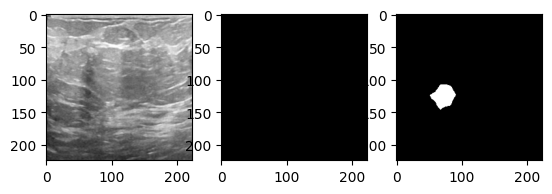

IOU: 0.0


/usr/local/lib/python3.11/dist-packages/sklearn/metrics/_classification.py:1565: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/usr/local/lib/python3.11/dist-packages/sklearn/metrics/_classification.py:1565: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/usr/local/lib/python3.11/dist-packages/sklearn/metrics/_classification.py:1565: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))


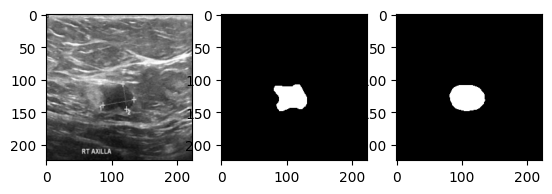

IOU: 0.76657824933687


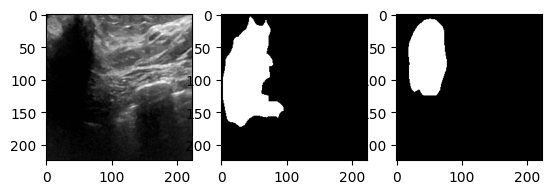

IOU: 0.5216167303438568


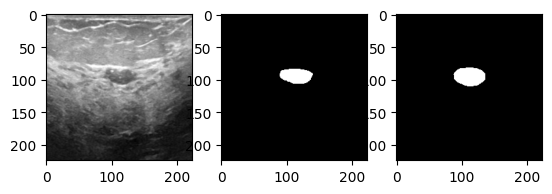

IOU: 0.7714285714285715


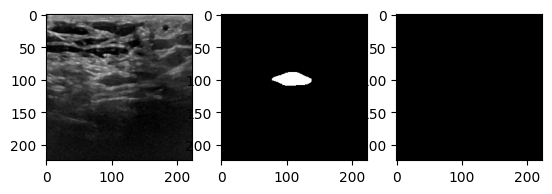

IOU: 0.0


/usr/local/lib/python3.11/dist-packages/sklearn/metrics/_classification.py:1565: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/usr/local/lib/python3.11/dist-packages/sklearn/metrics/_classification.py:1565: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/usr/local/lib/python3.11/dist-packages/sklearn/metrics/_classification.py:1565: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/usr/local/lib/python3.11/dist-packages/torch/_te

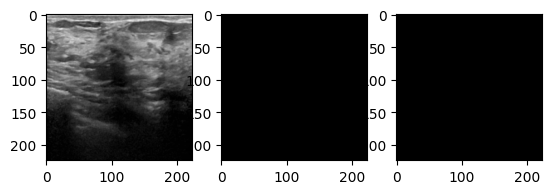

IOU: 1.0


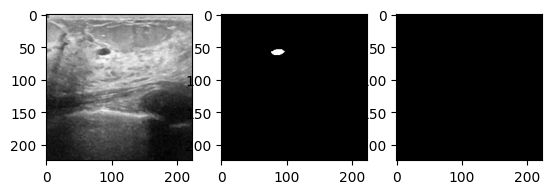

IOU: 0.0


/usr/local/lib/python3.11/dist-packages/sklearn/metrics/_classification.py:1565: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/usr/local/lib/python3.11/dist-packages/sklearn/metrics/_classification.py:1565: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/usr/local/lib/python3.11/dist-packages/sklearn/metrics/_classification.py:1565: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/usr/local/lib/python3.11/dist-packages/torch/_te

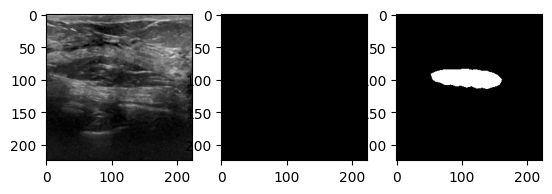

IOU: 0.0


/usr/local/lib/python3.11/dist-packages/sklearn/metrics/_classification.py:1565: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/usr/local/lib/python3.11/dist-packages/sklearn/metrics/_classification.py:1565: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/usr/local/lib/python3.11/dist-packages/sklearn/metrics/_classification.py:1565: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))


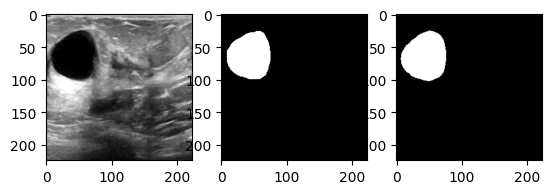

IOU: 0.93058568329718


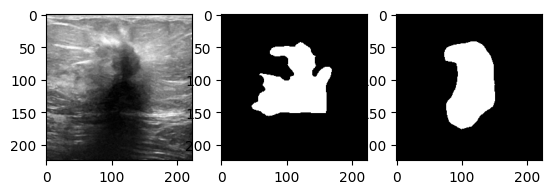

IOU: 0.558258642765685


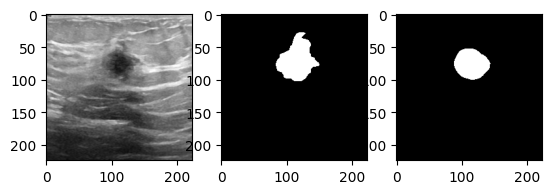

IOU: 0.67069799585349


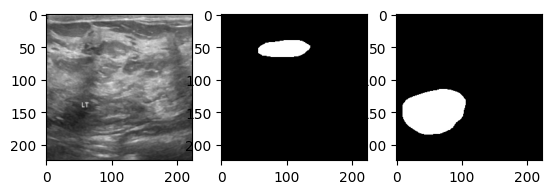

IOU: 0.0


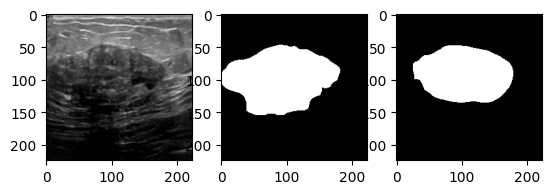

IOU: 0.7146854150225984


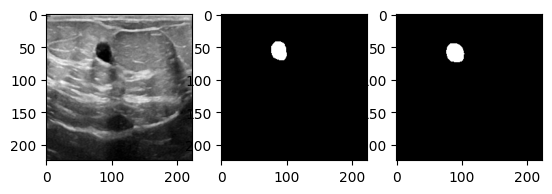

IOU: 0.7118881118881119


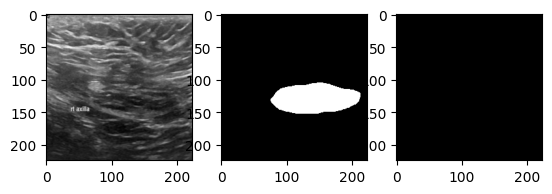

IOU: 0.0


/usr/local/lib/python3.11/dist-packages/sklearn/metrics/_classification.py:1565: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/usr/local/lib/python3.11/dist-packages/sklearn/metrics/_classification.py:1565: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/usr/local/lib/python3.11/dist-packages/sklearn/metrics/_classification.py:1565: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))


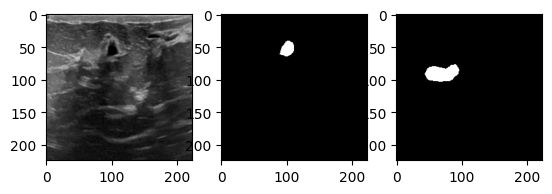

IOU: 0.0


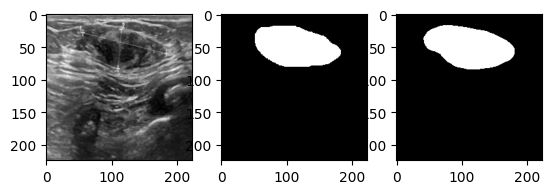

IOU: 0.8957971014492754


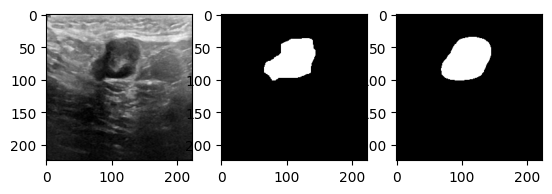

IOU: 0.862008072653885


/usr/local/lib/python3.11/dist-packages/torch/_tensor.py:1077: RuntimeWarning: invalid value encountered in multiply
  return self.reciprocal() * other
/usr/local/lib/python3.11/dist-packages/torch/_tensor.py:1196: RuntimeWarning: invalid value encountered in cast
  return self.numpy().astype(dtype, copy=False)


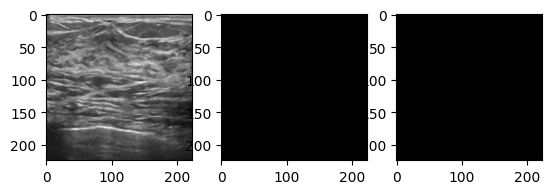

IOU: 1.0


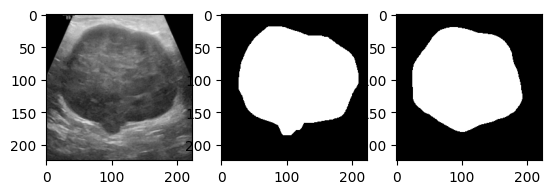

IOU: 0.8783588936951108


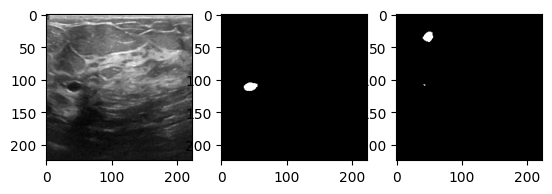

IOU: 0.012755102040816327


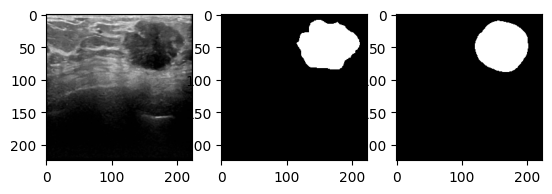

IOU: 0.8666912850812407


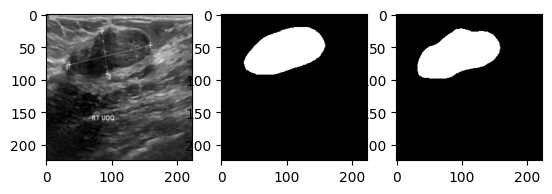

IOU: 0.846001134429949


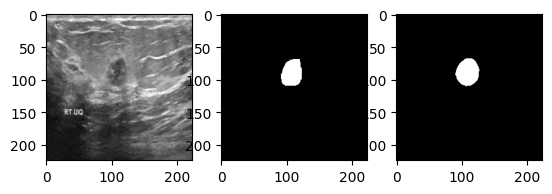

IOU: 0.8412955465587044


/usr/local/lib/python3.11/dist-packages/torch/_tensor.py:1077: RuntimeWarning: invalid value encountered in multiply
  return self.reciprocal() * other
/usr/local/lib/python3.11/dist-packages/torch/_tensor.py:1196: RuntimeWarning: invalid value encountered in cast
  return self.numpy().astype(dtype, copy=False)


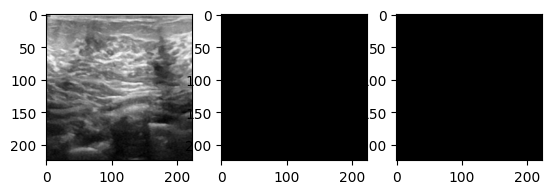

IOU: 1.0


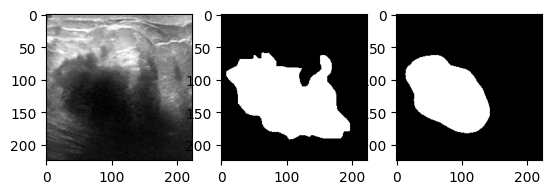

IOU: 0.639793635007459


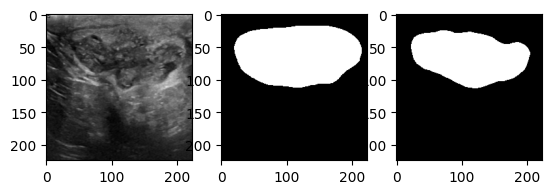

IOU: 0.7651611181533124


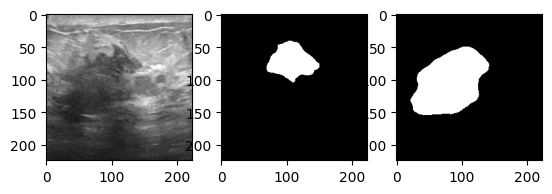

IOU: 0.2808621815806662


/usr/local/lib/python3.11/dist-packages/torch/_tensor.py:1077: RuntimeWarning: invalid value encountered in multiply
  return self.reciprocal() * other
/usr/local/lib/python3.11/dist-packages/torch/_tensor.py:1196: RuntimeWarning: invalid value encountered in cast
  return self.numpy().astype(dtype, copy=False)


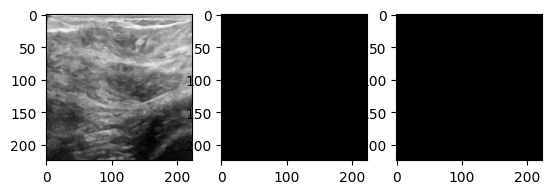

IOU: 1.0


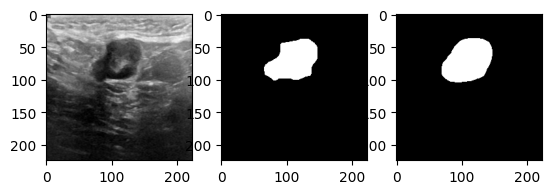

IOU: 0.8786337209302325


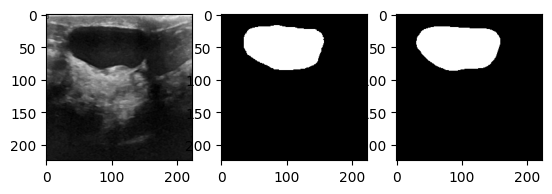

IOU: 0.9353940406571986


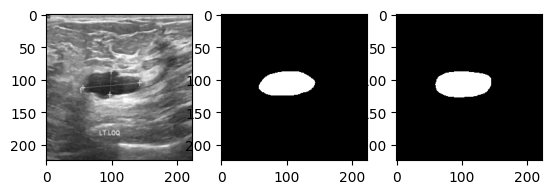

IOU: 0.8649861878453039


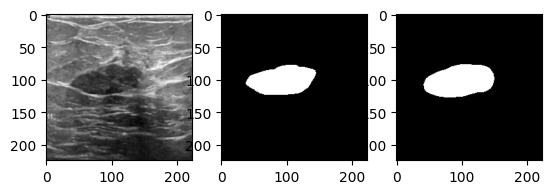

IOU: 0.8145437914475189


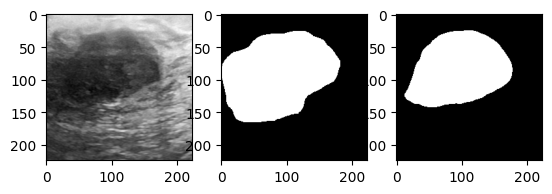

IOU: 0.7427069927069927


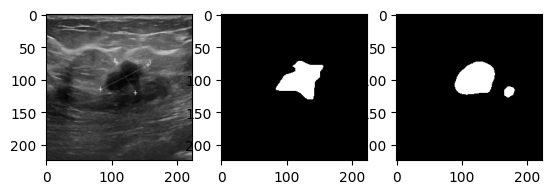

IOU: 0.7074667575860893


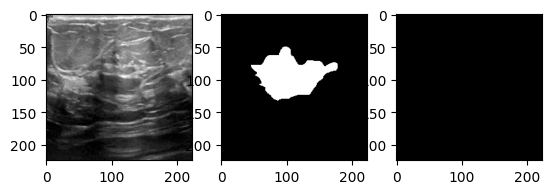

IOU: 0.0


/usr/local/lib/python3.11/dist-packages/sklearn/metrics/_classification.py:1565: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/usr/local/lib/python3.11/dist-packages/sklearn/metrics/_classification.py:1565: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/usr/local/lib/python3.11/dist-packages/sklearn/metrics/_classification.py:1565: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))


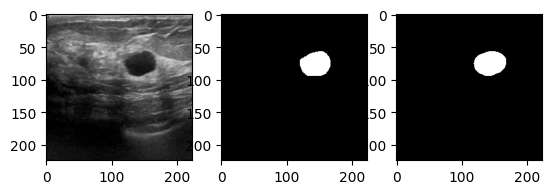

IOU: 0.8942558746736292


/usr/local/lib/python3.11/dist-packages/torch/_tensor.py:1077: RuntimeWarning: invalid value encountered in multiply
  return self.reciprocal() * other
/usr/local/lib/python3.11/dist-packages/torch/_tensor.py:1196: RuntimeWarning: invalid value encountered in cast
  return self.numpy().astype(dtype, copy=False)


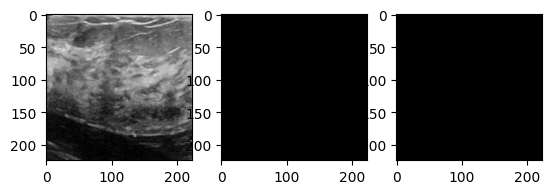

IOU: 1.0


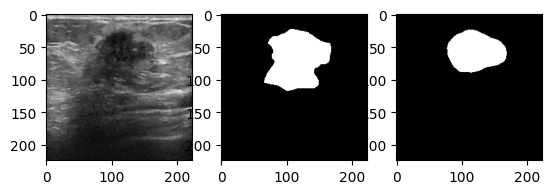

IOU: 0.6363239149431984


/usr/local/lib/python3.11/dist-packages/torch/_tensor.py:1077: RuntimeWarning: invalid value encountered in multiply
  return self.reciprocal() * other
/usr/local/lib/python3.11/dist-packages/torch/_tensor.py:1196: RuntimeWarning: invalid value encountered in cast
  return self.numpy().astype(dtype, copy=False)


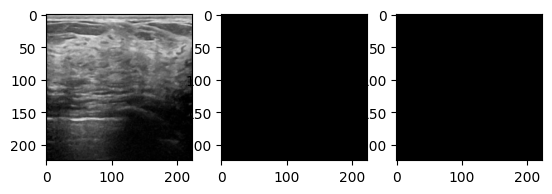

IOU: 1.0


/usr/local/lib/python3.11/dist-packages/torch/_tensor.py:1077: RuntimeWarning: invalid value encountered in multiply
  return self.reciprocal() * other
/usr/local/lib/python3.11/dist-packages/torch/_tensor.py:1196: RuntimeWarning: invalid value encountered in cast
  return self.numpy().astype(dtype, copy=False)


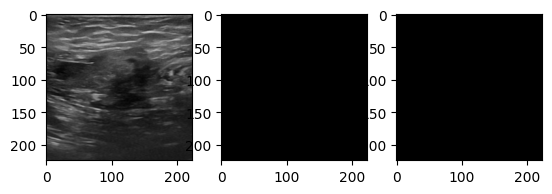

IOU: 1.0


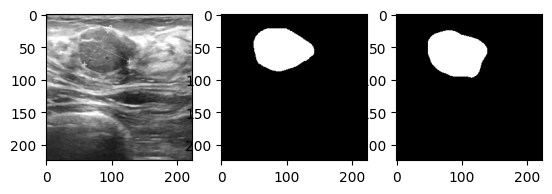

IOU: 0.7698544315459739


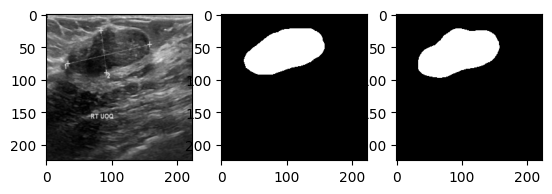

IOU: 0.892190533074511


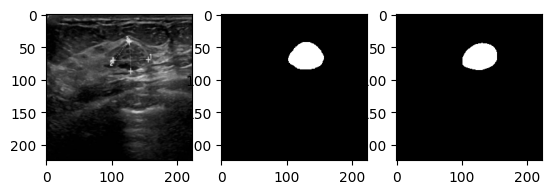

IOU: 0.8762830902215019


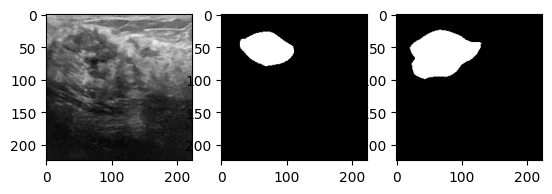

IOU: 0.5478447504918619


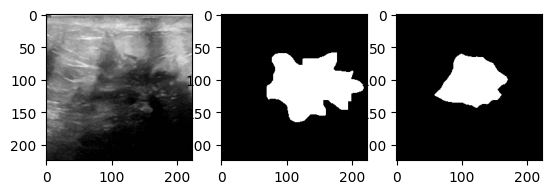

IOU: 0.5203637418980361


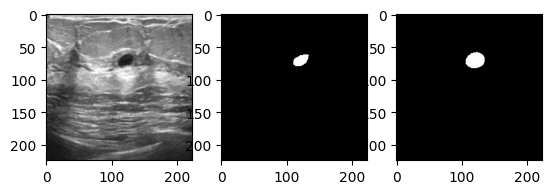

IOU: 0.5387323943661971


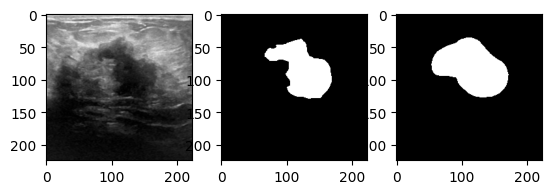

IOU: 0.7152271452607964


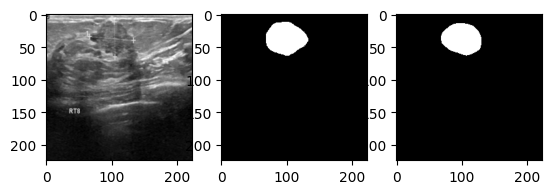

IOU: 0.8529299119111452


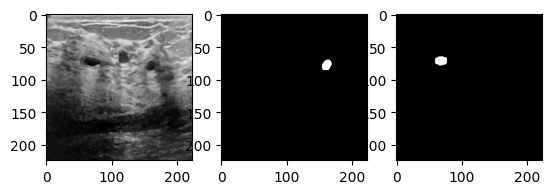

IOU: 0.0


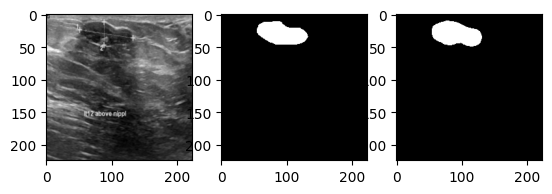

IOU: 0.8663755458515284


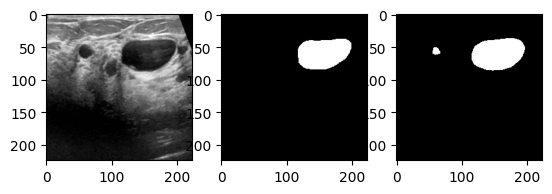

IOU: 0.8784256559766764


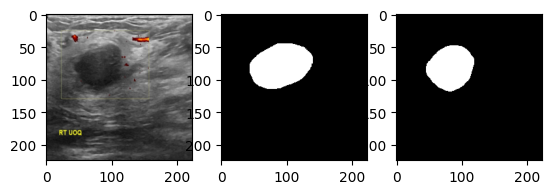

IOU: 0.7215505661101516


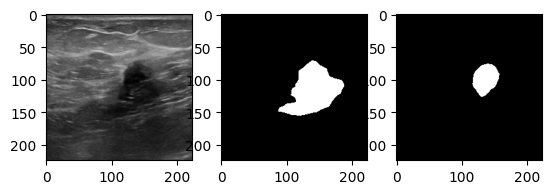

IOU: 0.3129280821917808


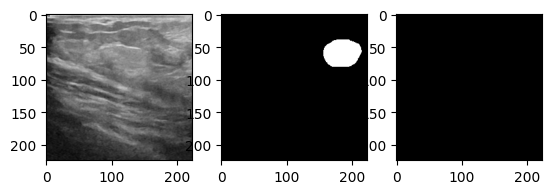

IOU: 0.0


/usr/local/lib/python3.11/dist-packages/sklearn/metrics/_classification.py:1565: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/usr/local/lib/python3.11/dist-packages/sklearn/metrics/_classification.py:1565: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/usr/local/lib/python3.11/dist-packages/sklearn/metrics/_classification.py:1565: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))


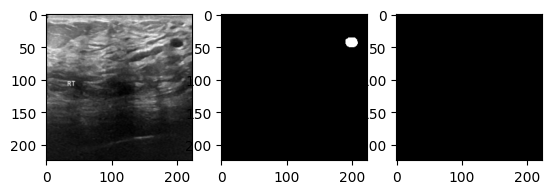

IOU: 0.0


/usr/local/lib/python3.11/dist-packages/sklearn/metrics/_classification.py:1565: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/usr/local/lib/python3.11/dist-packages/sklearn/metrics/_classification.py:1565: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/usr/local/lib/python3.11/dist-packages/sklearn/metrics/_classification.py:1565: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/usr/local/lib/python3.11/dist-packages/torch/_te

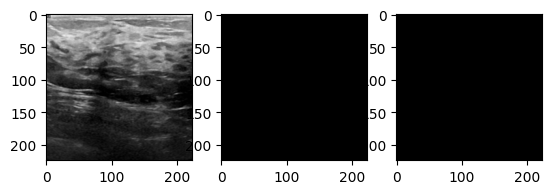

IOU: 1.0


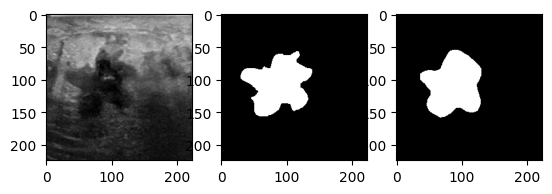

IOU: 0.8278246438943438


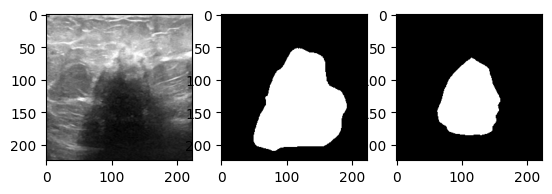

IOU: 0.5393871646501841


/usr/local/lib/python3.11/dist-packages/torch/_tensor.py:1077: RuntimeWarning: invalid value encountered in multiply
  return self.reciprocal() * other
/usr/local/lib/python3.11/dist-packages/torch/_tensor.py:1196: RuntimeWarning: invalid value encountered in cast
  return self.numpy().astype(dtype, copy=False)


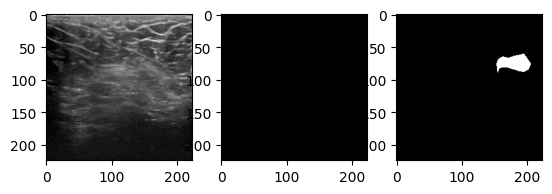

IOU: 0.0


/usr/local/lib/python3.11/dist-packages/sklearn/metrics/_classification.py:1565: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/usr/local/lib/python3.11/dist-packages/sklearn/metrics/_classification.py:1565: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/usr/local/lib/python3.11/dist-packages/sklearn/metrics/_classification.py:1565: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))


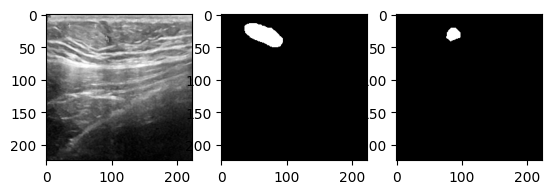

IOU: 0.11074489123269611


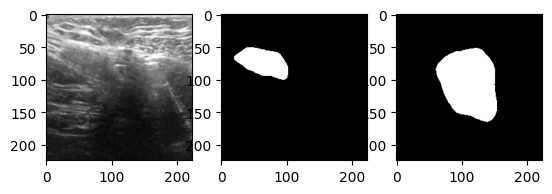

IOU: 0.12969464836684755


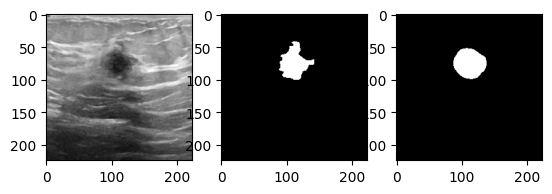

IOU: 0.718887262079063


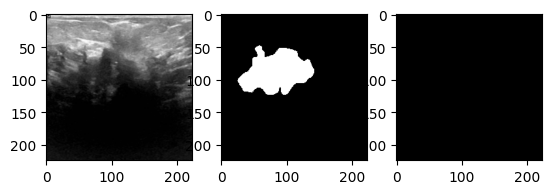

IOU: 0.0


/usr/local/lib/python3.11/dist-packages/sklearn/metrics/_classification.py:1565: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/usr/local/lib/python3.11/dist-packages/sklearn/metrics/_classification.py:1565: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/usr/local/lib/python3.11/dist-packages/sklearn/metrics/_classification.py:1565: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))


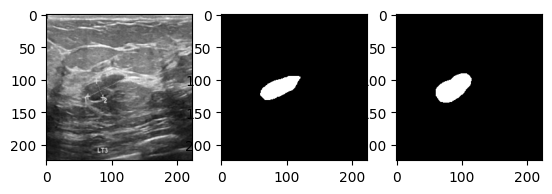

IOU: 0.7440334128878282


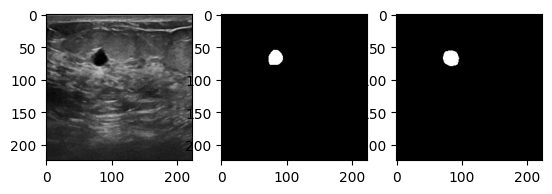

IOU: 0.8089430894308943


/usr/local/lib/python3.11/dist-packages/torch/_tensor.py:1077: RuntimeWarning: invalid value encountered in multiply
  return self.reciprocal() * other
/usr/local/lib/python3.11/dist-packages/torch/_tensor.py:1196: RuntimeWarning: invalid value encountered in cast
  return self.numpy().astype(dtype, copy=False)


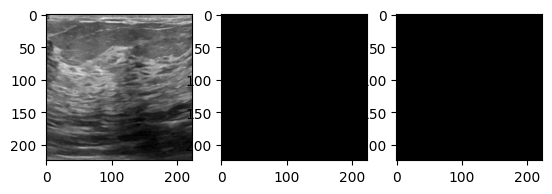

IOU: 1.0


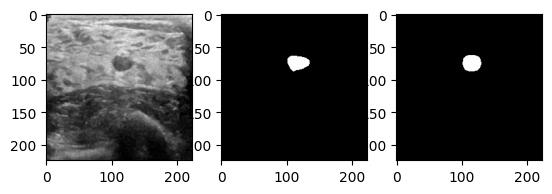

IOU: 0.7946428571428571


/usr/local/lib/python3.11/dist-packages/torch/_tensor.py:1077: RuntimeWarning: invalid value encountered in multiply
  return self.reciprocal() * other
/usr/local/lib/python3.11/dist-packages/torch/_tensor.py:1196: RuntimeWarning: invalid value encountered in cast
  return self.numpy().astype(dtype, copy=False)


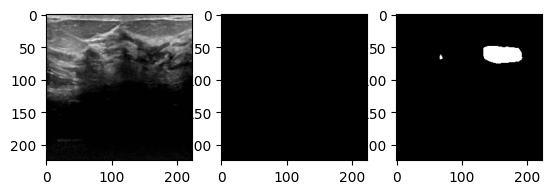

IOU: 0.0


/usr/local/lib/python3.11/dist-packages/sklearn/metrics/_classification.py:1565: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/usr/local/lib/python3.11/dist-packages/sklearn/metrics/_classification.py:1565: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/usr/local/lib/python3.11/dist-packages/sklearn/metrics/_classification.py:1565: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/usr/local/lib/python3.11/dist-packages/torch/_tensor.py:1077: RuntimeWar

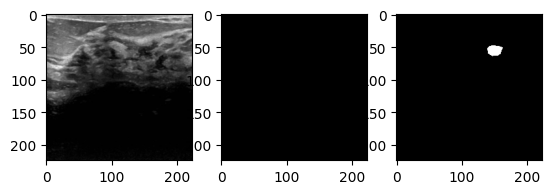

IOU: 0.0


/usr/local/lib/python3.11/dist-packages/sklearn/metrics/_classification.py:1565: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/usr/local/lib/python3.11/dist-packages/sklearn/metrics/_classification.py:1565: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/usr/local/lib/python3.11/dist-packages/sklearn/metrics/_classification.py:1565: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))


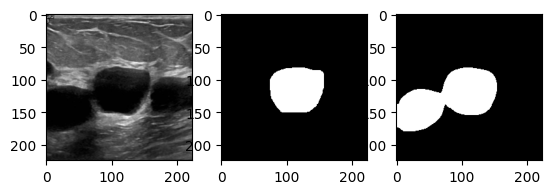

IOU: 0.5105707087304195


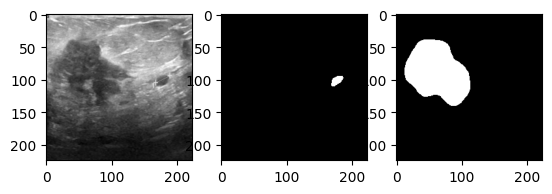

IOU: 0.0


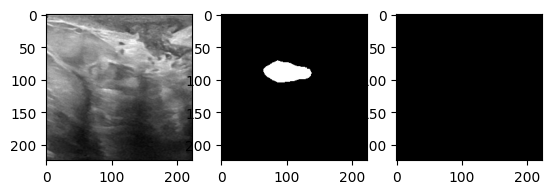

IOU: 0.0


/usr/local/lib/python3.11/dist-packages/sklearn/metrics/_classification.py:1565: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/usr/local/lib/python3.11/dist-packages/sklearn/metrics/_classification.py:1565: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/usr/local/lib/python3.11/dist-packages/sklearn/metrics/_classification.py:1565: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))


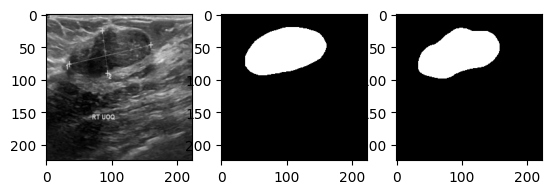

IOU: 0.8680709534368071


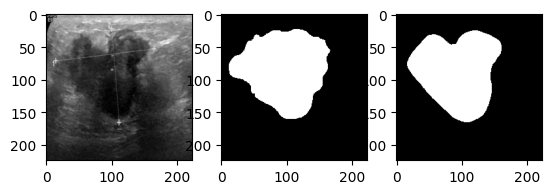

IOU: 0.8539646699428876


/usr/local/lib/python3.11/dist-packages/torch/_tensor.py:1077: RuntimeWarning: invalid value encountered in multiply
  return self.reciprocal() * other
/usr/local/lib/python3.11/dist-packages/torch/_tensor.py:1196: RuntimeWarning: invalid value encountered in cast
  return self.numpy().astype(dtype, copy=False)


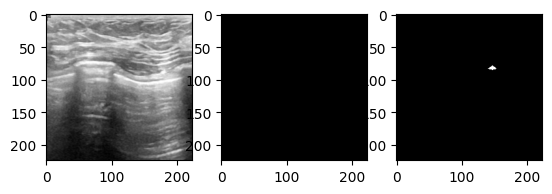

IOU: 0.0


/usr/local/lib/python3.11/dist-packages/sklearn/metrics/_classification.py:1565: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/usr/local/lib/python3.11/dist-packages/sklearn/metrics/_classification.py:1565: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/usr/local/lib/python3.11/dist-packages/sklearn/metrics/_classification.py:1565: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))


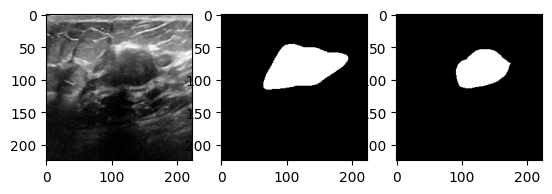

IOU: 0.5779455201837873


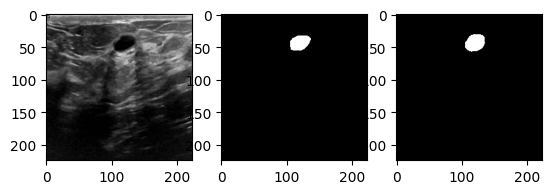

IOU: 0.848575712143928


/usr/local/lib/python3.11/dist-packages/torch/_tensor.py:1077: RuntimeWarning: invalid value encountered in multiply
  return self.reciprocal() * other
/usr/local/lib/python3.11/dist-packages/torch/_tensor.py:1196: RuntimeWarning: invalid value encountered in cast
  return self.numpy().astype(dtype, copy=False)


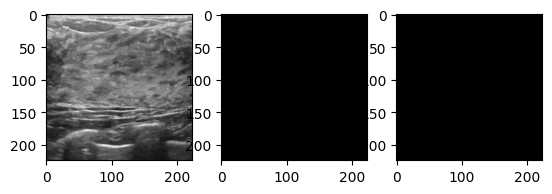

IOU: 1.0


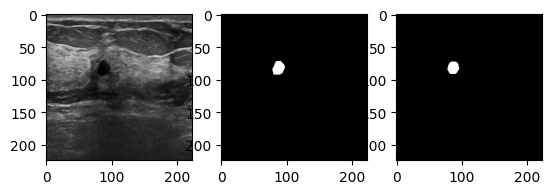

IOU: 0.8391167192429022


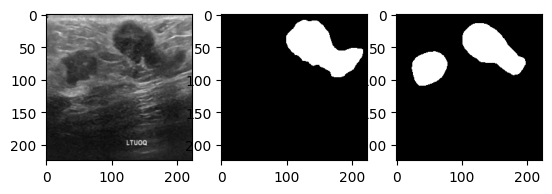

IOU: 0.547172253138346


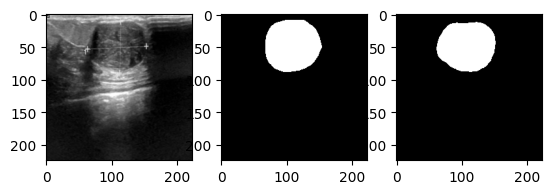

IOU: 0.9052326572353844


/usr/local/lib/python3.11/dist-packages/torch/_tensor.py:1077: RuntimeWarning: invalid value encountered in multiply
  return self.reciprocal() * other
/usr/local/lib/python3.11/dist-packages/torch/_tensor.py:1196: RuntimeWarning: invalid value encountered in cast
  return self.numpy().astype(dtype, copy=False)


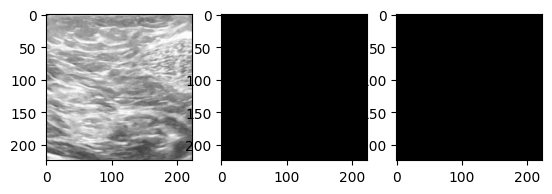

IOU: 1.0


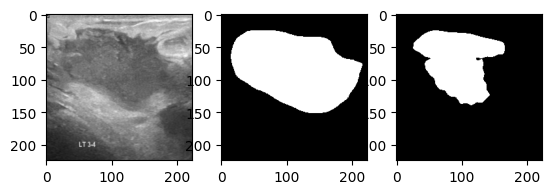

IOU: 0.5400077955342725


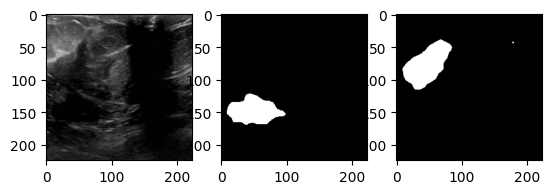

IOU: 0.0


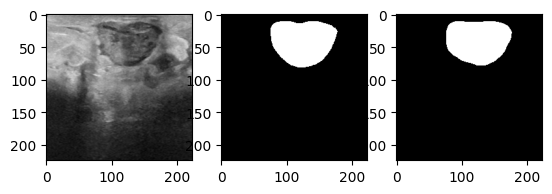

IOU: 0.9401176877812392


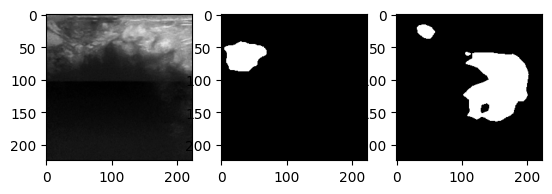

IOU: 0.0


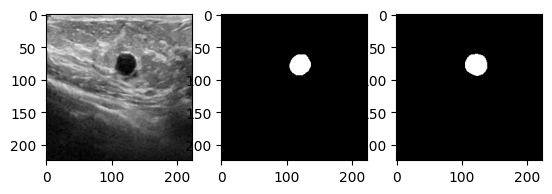

IOU: 0.8432203389830508


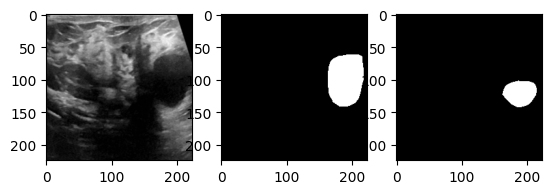

IOU: 0.4101153039832285


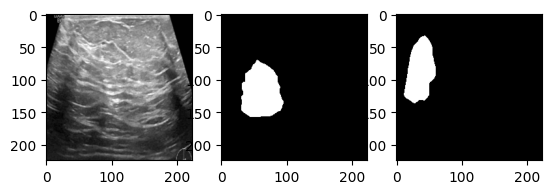

IOU: 0.15818181818181817


/usr/local/lib/python3.11/dist-packages/torch/_tensor.py:1077: RuntimeWarning: invalid value encountered in multiply
  return self.reciprocal() * other
/usr/local/lib/python3.11/dist-packages/torch/_tensor.py:1196: RuntimeWarning: invalid value encountered in cast
  return self.numpy().astype(dtype, copy=False)


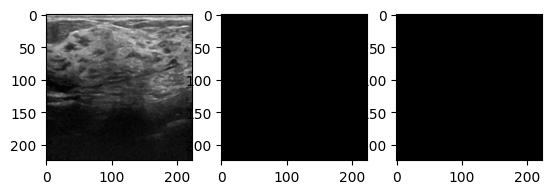

IOU: 1.0


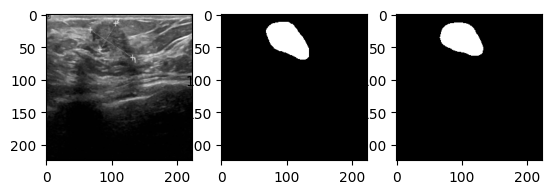

IOU: 0.8569288389513109


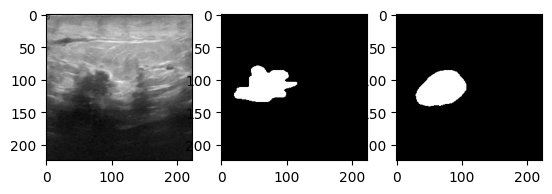

IOU: 0.6918356456776947


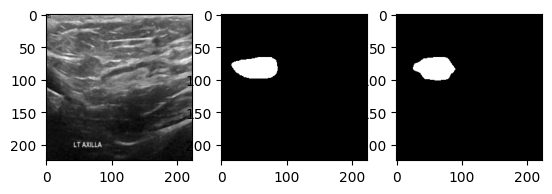

IOU: 0.7874443895205141


/usr/local/lib/python3.11/dist-packages/torch/_tensor.py:1077: RuntimeWarning: invalid value encountered in multiply
  return self.reciprocal() * other
/usr/local/lib/python3.11/dist-packages/torch/_tensor.py:1196: RuntimeWarning: invalid value encountered in cast
  return self.numpy().astype(dtype, copy=False)


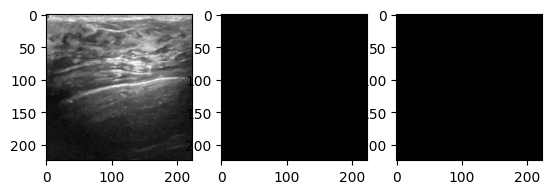

IOU: 1.0


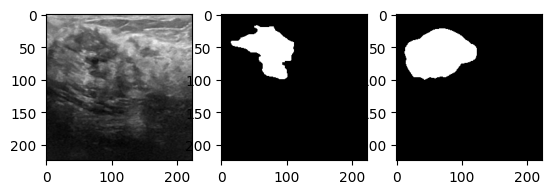

IOU: 0.5604530149984696


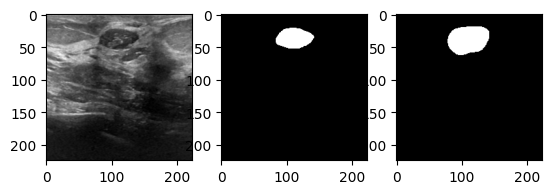

IOU: 0.6289391921881935


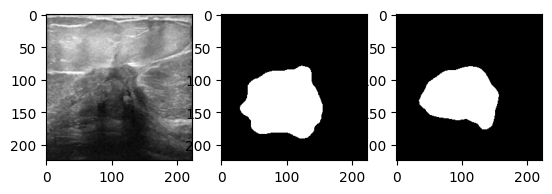

IOU: 0.7279715035620548


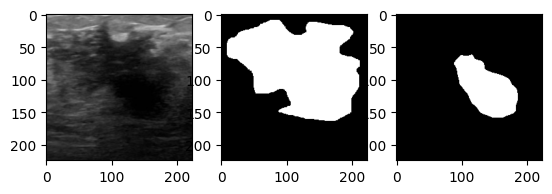

IOU: 0.26785714285714285


/usr/local/lib/python3.11/dist-packages/torch/_tensor.py:1077: RuntimeWarning: invalid value encountered in multiply
  return self.reciprocal() * other
/usr/local/lib/python3.11/dist-packages/torch/_tensor.py:1196: RuntimeWarning: invalid value encountered in cast
  return self.numpy().astype(dtype, copy=False)


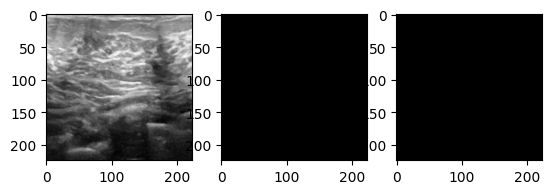

IOU: 1.0


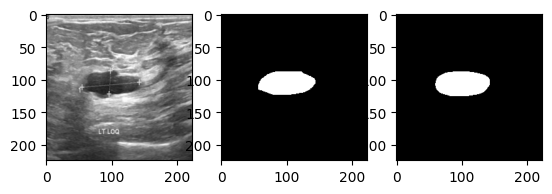

IOU: 0.9039444850255661


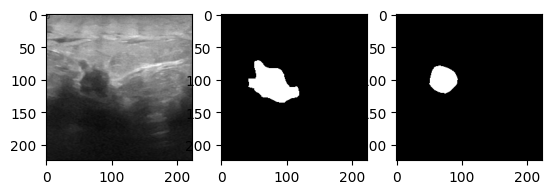

IOU: 0.4777542372881356


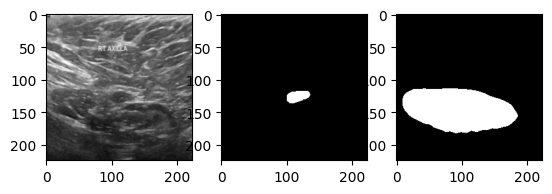

IOU: 0.05436787845903418


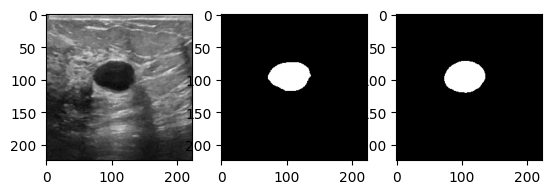

IOU: 0.8881118881118881


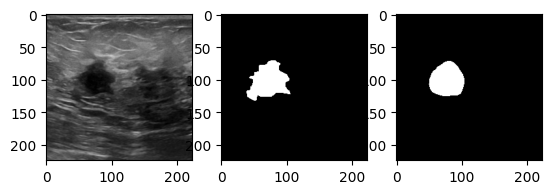

IOU: 0.7412233079985523


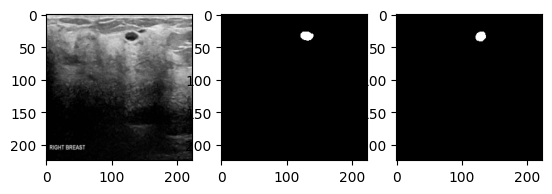

IOU: 0.7053941908713693


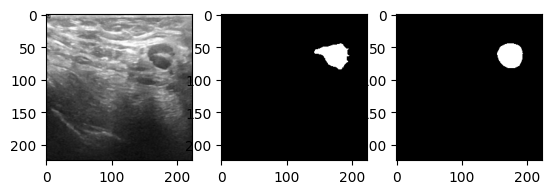

IOU: 0.7997054491899853


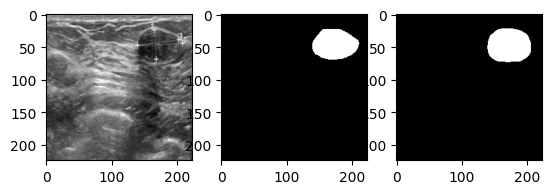

IOU: 0.8518890003343363


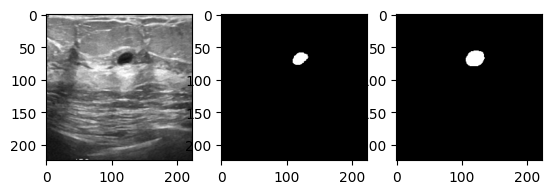

IOU: 0.5888689407540395


/usr/local/lib/python3.11/dist-packages/torch/_tensor.py:1077: RuntimeWarning: invalid value encountered in multiply
  return self.reciprocal() * other
/usr/local/lib/python3.11/dist-packages/torch/_tensor.py:1196: RuntimeWarning: invalid value encountered in cast
  return self.numpy().astype(dtype, copy=False)


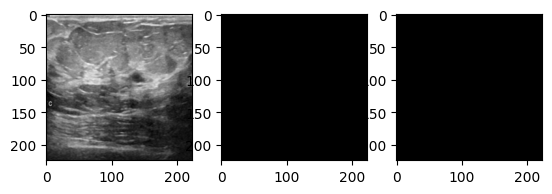

IOU: 1.0


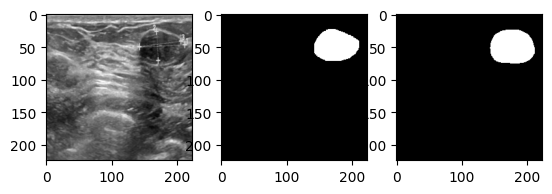

IOU: 0.8346999016070843


/usr/local/lib/python3.11/dist-packages/torch/_tensor.py:1077: RuntimeWarning: invalid value encountered in multiply
  return self.reciprocal() * other
/usr/local/lib/python3.11/dist-packages/torch/_tensor.py:1196: RuntimeWarning: invalid value encountered in cast
  return self.numpy().astype(dtype, copy=False)


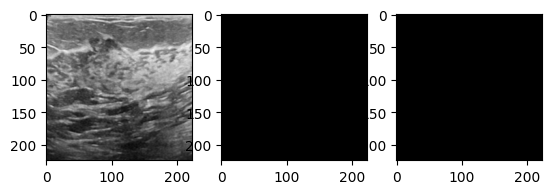

IOU: 1.0


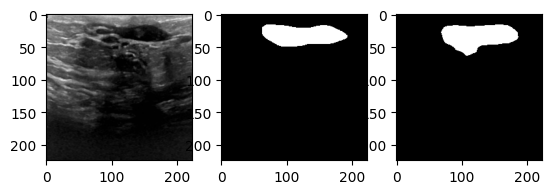

IOU: 0.7884713052310818


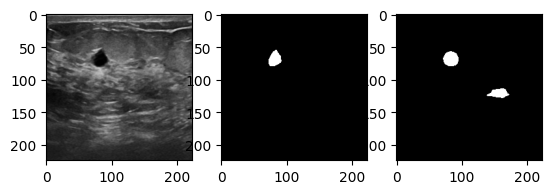

IOU: 0.41243654822335024


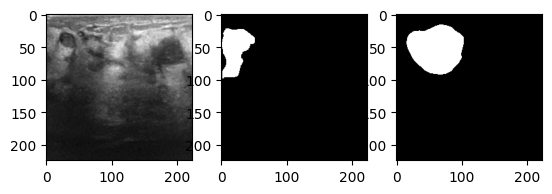

IOU: 0.15588416512630932


/usr/local/lib/python3.11/dist-packages/torch/_tensor.py:1077: RuntimeWarning: invalid value encountered in multiply
  return self.reciprocal() * other
/usr/local/lib/python3.11/dist-packages/torch/_tensor.py:1196: RuntimeWarning: invalid value encountered in cast
  return self.numpy().astype(dtype, copy=False)


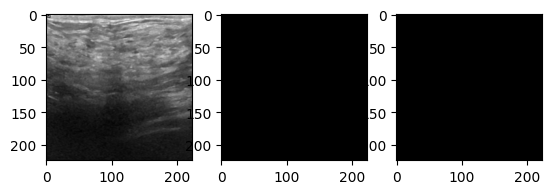

IOU: 1.0


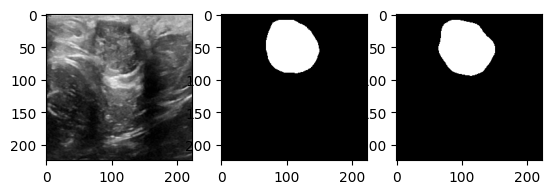

IOU: 0.913614858945155


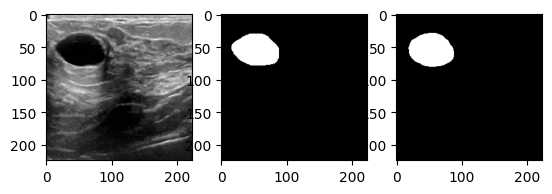

IOU: 0.9322558459422283


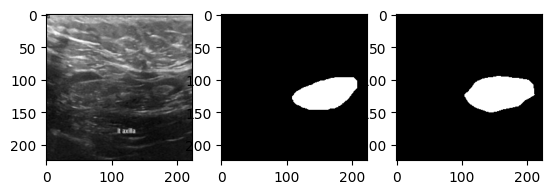

IOU: 0.7878103837471784


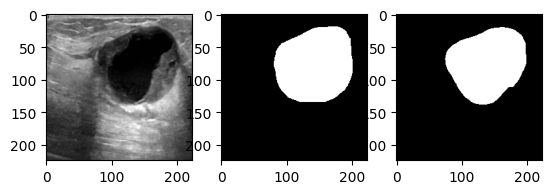

IOU: 0.8785744590581247


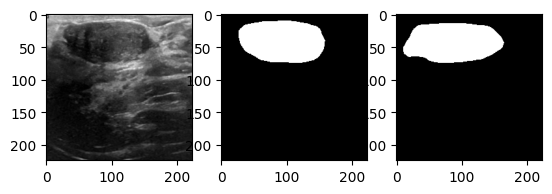

IOU: 0.8178217821782178


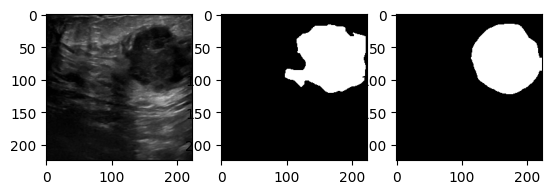

IOU: 0.8211125800874606


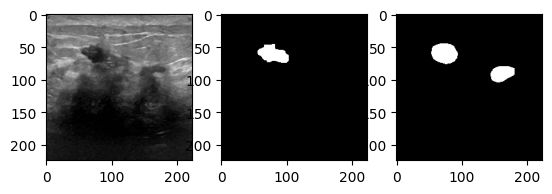

IOU: 0.3950682056663169


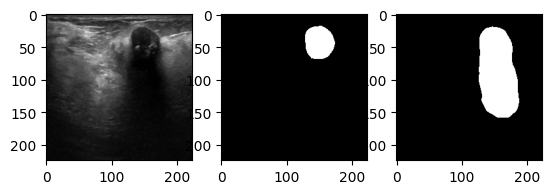

IOU: 0.26247848537005164


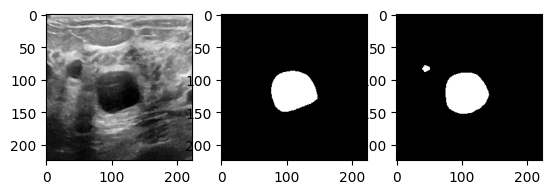

IOU: 0.8127311146328579


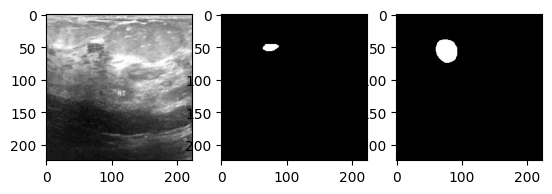

IOU: 0.22712933753943218


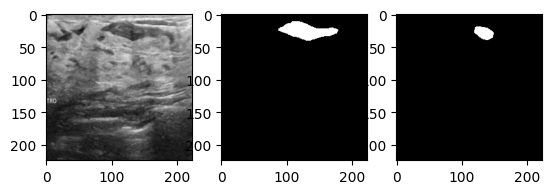

IOU: 0.2906371911573472


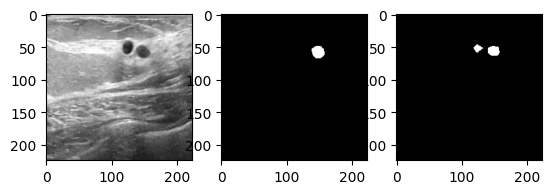

IOU: 0.5288461538461539


/usr/local/lib/python3.11/dist-packages/torch/_tensor.py:1077: RuntimeWarning: invalid value encountered in multiply
  return self.reciprocal() * other
/usr/local/lib/python3.11/dist-packages/torch/_tensor.py:1196: RuntimeWarning: invalid value encountered in cast
  return self.numpy().astype(dtype, copy=False)


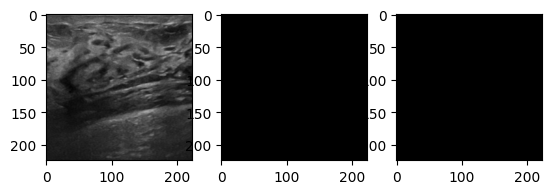

IOU: 1.0


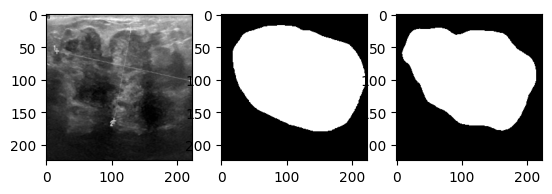

IOU: 0.8758839213261718


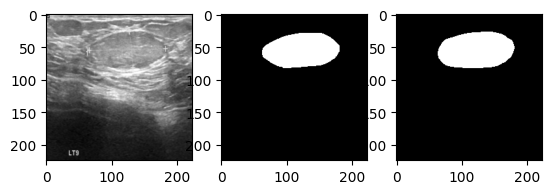

IOU: 0.9187939326674066


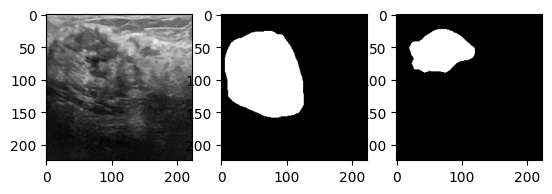

IOU: 0.32567425041434384
Average IOU: 0.6293388113681968
The Average Classification Report
              precision    recall  f1-score       support
0              0.975374  0.983885  0.978699  46174.185897
1              0.681754  0.683222  0.655727   4624.318519
accuracy       0.963758  0.963758  0.963758      0.963758
macro avg      0.849984  0.854875  0.840385  50176.000000
weighted avg   0.969168  0.963758  0.963206  50176.000000


In [ ]:
#written by Angel
#Print the image, mask, and prediction for each index of the first model

iou_avg = []
classification_avg = []

for i, (image, label_tr) in enumerate(test_dataset):
    image = image.unsqueeze(0).to(device)
    model.eval()

    with torch.no_grad():
        output = model(image)['out']
        segmentation_result = torch.argmax(output, dim=1)

    segmentation_result = segmentation_result.squeeze(0).cpu().numpy()
    segmentation_pre = cv2.resize(segmentation_result, (label_tr.shape[1], label_tr.shape[0]), interpolation=cv2.INTER_NEAREST)


    pic = np.uint8(label_tr.cpu().numpy() / label_tr.max())

    plt.subplot(1, 3, 1)
    plt.imshow(image.cpu().squeeze(0).permute(1, 2, 0))

    plt.subplot(1, 3, 2)
    plt.imshow(pic, cmap="gray")

    plt.subplot(1, 3, 3)
    plt.imshow(segmentation_pre, cmap="gray")

    plt.show()

#save the IOU and print each one
    iou = jaccard_score(pic.flatten(), segmentation_pre.flatten(),zero_division=1)
    iou_avg.append(iou)


    print("IOU: " + str(iou))


#save the classification report of each one
    IndReport = classification_report(pic.flatten(), segmentation_pre.flatten(), output_dict=True)
    classification_avg.append(IndReport)

classification_flatten = []

for IndReport in classification_avg:
    df = pd.DataFrame(IndReport).T
    classification_flatten.append(df)

classification_comb = pd.concat(classification_flatten)
classification_avgRT = classification_comb.groupby(classification_comb.index).mean()

#print the Average IOU
iou_avgRt = np.mean(iou_avg)
print("Average IOU: " + str(iou_avgRt))

#print the Average Classification report
print("The Average Classification Report")
print(classification_avgRT)





In [ ]:
#written by Angel
#going through test_dataset
for i, (image, label_tr) in enumerate(test_dataset):

#converts it to numpy array then watershed method is applied
    image_input = image.unsqueeze(0).to(device)
    model.eval()
    with torch.no_grad():
        output = model(image_input)['out']
        segmentation_result = torch.argmax(output, dim=1).squeeze(0).cpu().numpy()


    image_num = image.squeeze(0).cpu().numpy().transpose(1, 2, 0)
    image_num = np.uint8(image_num * 255)

    thresh = np.uint8(segmentation_result * 255)

    dist_transform = cv2.distanceTransform(thresh, cv2.DIST_L2, 3)

    ret, sure_fg = cv2.threshold(dist_transform, 0.5 * dist_transform.max(), 255, 0)
    sure_fg = np.uint8(sure_fg)

    unsure = cv2.subtract(thresh, sure_fg)

    ret, index = cv2.connectedComponents(sure_fg)

    index2 = index + 1
    index2[unsure == 255] = 0

    result = cv2.watershed(image_num, index2)

    image_num[result == -1] = [0, 0, 255]
#the results are printed
    plt.figure(figsize=(20, 10))
    plt.subplot(1, 7, 1)
    plt.title('Distance')
    plt.imshow(dist_transform, cmap='gray')

    plt.subplot(1, 7, 2)
    plt.title('foreground')
    plt.imshow(sure_fg, cmap='gray')

    plt.subplot(1, 7, 3)
    plt.title('Unsure')
    plt.imshow(unsure, cmap='gray')

    plt.subplot(1, 7, 4)
    plt.title('Index')
    plt.imshow(index, cmap='gray')

    plt.subplot(1, 7, 5)
    plt.title('index2')
    plt.imshow(index2, cmap='gray')

    plt.subplot(1, 7, 6)
    plt.title(' Result')
    plt.imshow(result, cmap='gray')

    plt.subplot(1, 7, 7)
    plt.title('result')
    plt.imshow(cv2.cvtColor(image_num, cv2.COLOR_BGR2RGB))


    plt.show()

In [ ]:
#written by Angel
#Creating the second CustomDataset Loader
import torchvision.transforms.functional as TF
from PIL import Image
import numpy as np

class CustomDataset2(Dataset):
    def __init__(self, images, labels, transform=None):
        self.images = images
        self.labels = labels
        self.transform = transform

#histogram equalization is applied as the new method
    def eqHis(self, imgTr):
     pilImg = TF.to_pil_image(imgTr).convert("RGB")
     numpyImg = np.array(pilImg)
     gray = cv2.cvtColor(numpyImg, cv2.COLOR_RGB2GRAY)
     equalized = cv2.equalizeHist(gray)
     equalized_rgb = cv2.cvtColor(equalized, cv2.COLOR_GRAY2RGB)
     equalized_tensor = TF.to_tensor(Image.fromarray(equalized_rgb))

     return equalized_tensor

    def __len__(self):
        return len(self.images)

    def __getitem__(self, idx):
        image_path = self.images[idx]
        label_path = self.labels[idx]

        image = Image.open(image_path).convert("RGB")
        label = Image.open(label_path).convert("L")

        if self.transform:
            image = self.transform(image)
            label = self.transform(label)


            image = self.eqHis(image)

            max_value = label.max()
            label = label / max_value
            label = label.type(torch.LongTensor)
            label = (label > 0.5).long()
            label = label.squeeze(0)

        return image, label
transform = transforms.Compose([
    transforms.Resize((224, 224)),
    transforms.ToTensor()])

train_dataset2 = CustomDataset2(image_train, mask_train, transform=transform)
test_dataset2 = CustomDataset2(image_test, mask_test, transform=transform)

print(len(train_dataset2))
print(len(test_dataset2))


train_loader2 = DataLoader(train_dataset2, batch_size=16, shuffle=True, num_workers=2)
test_loader2 = DataLoader(test_dataset2, batch_size=16, shuffle=False, num_workers=2)

624
156


In [ ]:
#CREATING the second MODEL
#written by Angel
device = torch.device("cuda" if torch.cuda.is_available() else "cpu")
model2 = models.segmentation.deeplabv3_resnet50(pretrained=True)
model2.classifier[4] = nn.Conv2d(256, 2, kernel_size=(1, 1), stride=(1, 1))
model2 = model2.to(device)


criterion = nn.CrossEntropyLoss()
optimizer = torch.optim.Adam(model2.parameters(), lr=0.0001)

/usr/local/lib/python3.11/dist-packages/torchvision/models/_utils.py:208: UserWarning: The parameter 'pretrained' is deprecated since 0.13 and may be removed in the future, please use 'weights' instead.
  warnings.warn(
/usr/local/lib/python3.11/dist-packages/torchvision/models/_utils.py:223: UserWarning: Arguments other than a weight enum or `None` for 'weights' are deprecated since 0.13 and may be removed in the future. The current behavior is equivalent to passing `weights=DeepLabV3_ResNet50_Weights.COCO_WITH_VOC_LABELS_V1`. You can also use `weights=DeepLabV3_ResNet50_Weights.DEFAULT` to get the most up-to-date weights.
  warnings.warn(msg)


Testing: 100%|██████████| 10/10 [00:04<00:00,  2.44it/s]


Epoch 1, Train Loss: 0.4128161615286118, Test Loss: 0.3369102030992508


Testing: 100%|██████████| 10/10 [00:04<00:00,  2.37it/s]


Epoch 2, Train Loss: 0.18998371828825045, Test Loss: 0.167893136292696


Testing: 100%|██████████| 10/10 [00:04<00:00,  2.00it/s]


Epoch 3, Train Loss: 0.12980447422999603, Test Loss: 0.14744001999497414


Testing: 100%|██████████| 10/10 [00:04<00:00,  2.34it/s]


Epoch 4, Train Loss: 0.09845949613895172, Test Loss: 0.13410061672329904


Testing: 100%|██████████| 10/10 [00:05<00:00,  1.95it/s]

Epoch 5, Train Loss: 0.08017955682216546, Test Loss: 0.12658661231398582
Finished Training


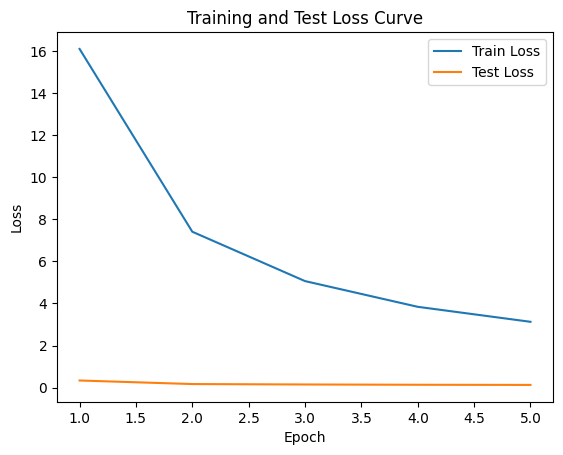

In [ ]:
#written by Angel
#Training & Testing The second Model
import cv2
num_epochs = 5
train_losses = []
test_losses = []

for epoch in range(num_epochs):
  model2.train()
  train_loss = 0.0
  for images, labels in tqdm(train_loader2, desc=f"Epoch {epoch+1}/{num_epochs}"):
    images, labels = images.to(device), labels.to(device)
    optimizer.zero_grad()
    outputs = model2(images)
    loss = criterion(outputs['out'], labels)
    loss.backward()
    optimizer.step()
    train_loss += loss.item()

  epoch_training_loss = train_loss / len(train_loader2)
  train_losses.append(train_loss)
  model2.eval()
  test_loss = 0.0
  correct = 0
  total = 0
  with torch.no_grad():
    for images, labels in tqdm(test_loader2, desc="Testing"):
      images, labels = images.to(device), labels.to(device)
      outputs = model2(images)
      loss = criterion(outputs['out'], labels)
      test_loss += loss.item()
      _, predicted = torch.max(outputs['out'], 1)
      total += labels.size(0)
      correct += (predicted == labels).sum().item()

  epoch_test_loss = test_loss / len(test_loader2)
  test_losses.append(epoch_test_loss)
  print(f"Epoch {epoch+1}, Train Loss: {epoch_training_loss}, Test Loss: {epoch_test_loss}")

print('Finished Training')

plt.plot(range(1, num_epochs+1), train_losses, label='Train Loss')
plt.plot(range(1, num_epochs+1), test_losses, label='Test Loss')
plt.xlabel('Epoch')
plt.ylabel('Loss')
plt.title('Training and Test Loss Curve')
plt.legend()
plt.show()


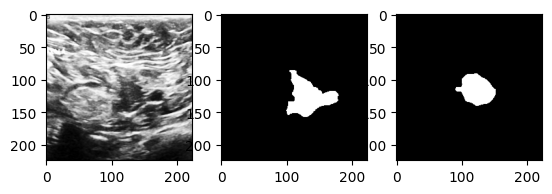

IOU: 0.42543217111046


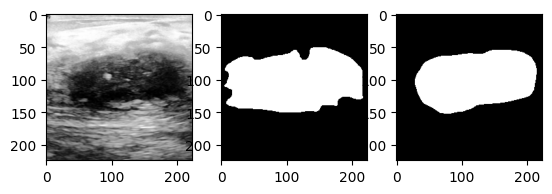

IOU: 0.7937198635775609


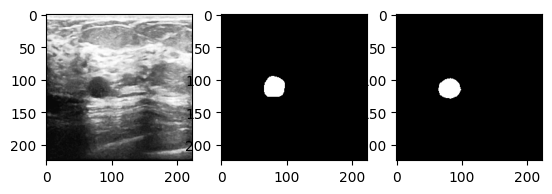

IOU: 0.8210412147505423


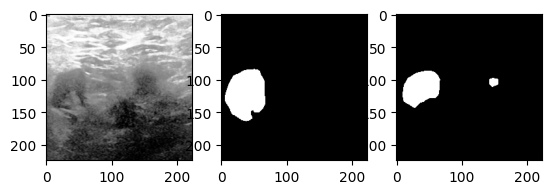

IOU: 0.6031258006661543


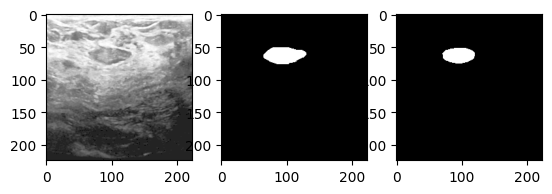

IOU: 0.7443491816056118


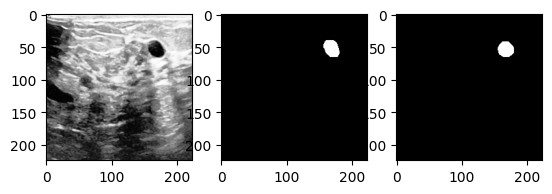

IOU: 0.7660714285714286


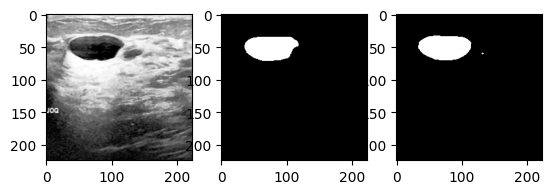

IOU: 0.8978576893649579


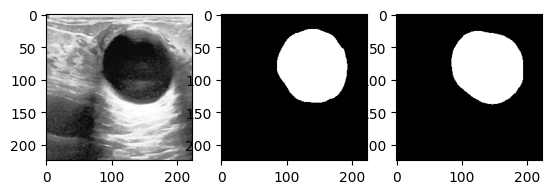

IOU: 0.926997107808916


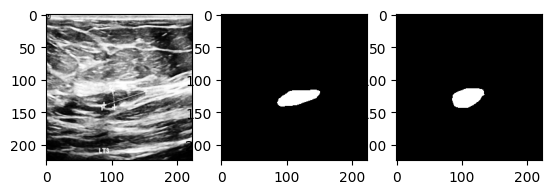

IOU: 0.6189791516894321


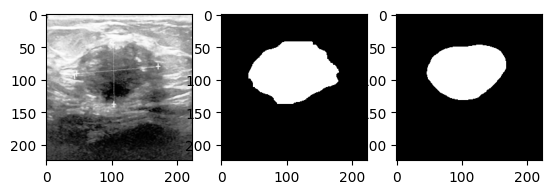

IOU: 0.8177894736842105


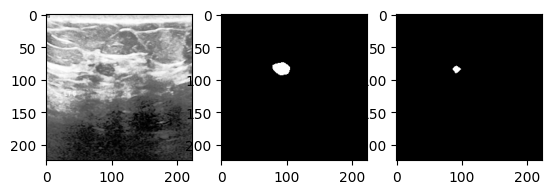

IOU: 0.22413793103448276


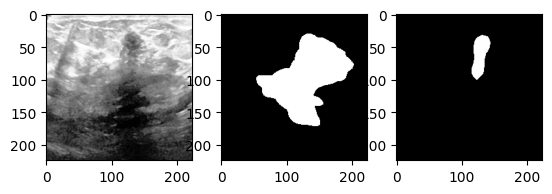

IOU: 0.12051331532226939


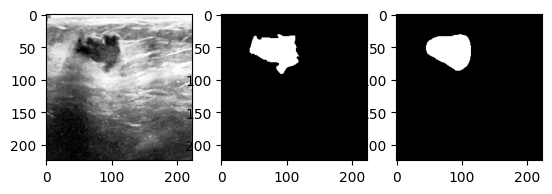

IOU: 0.84375


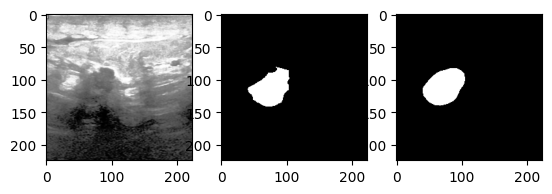

IOU: 0.7948807854137447


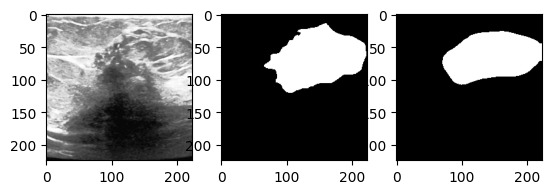

IOU: 0.8204235294117647


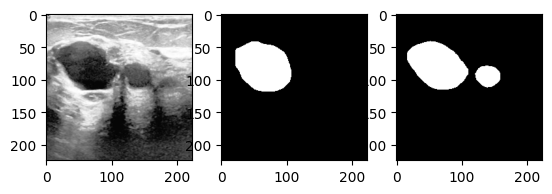

IOU: 0.7447447447447447


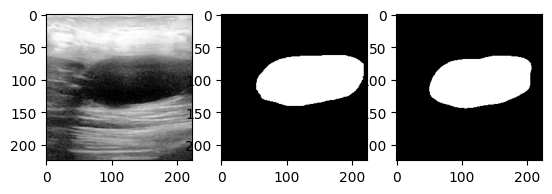

IOU: 0.8765636497424577


/usr/local/lib/python3.11/dist-packages/torch/_tensor.py:1077: RuntimeWarning: invalid value encountered in multiply
  return self.reciprocal() * other
/usr/local/lib/python3.11/dist-packages/torch/_tensor.py:1196: RuntimeWarning: invalid value encountered in cast
  return self.numpy().astype(dtype, copy=False)


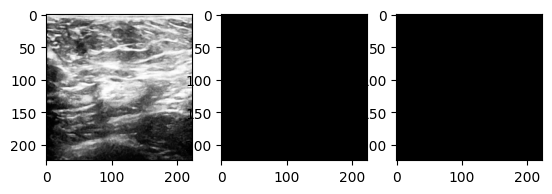

IOU: 1.0


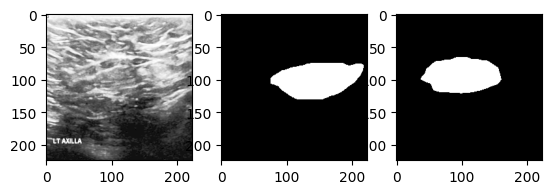

IOU: 0.32980004818116115


/usr/local/lib/python3.11/dist-packages/torch/_tensor.py:1077: RuntimeWarning: invalid value encountered in multiply
  return self.reciprocal() * other
/usr/local/lib/python3.11/dist-packages/torch/_tensor.py:1196: RuntimeWarning: invalid value encountered in cast
  return self.numpy().astype(dtype, copy=False)


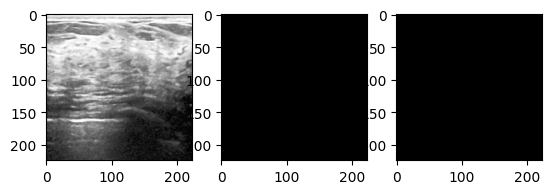

IOU: 1.0


/usr/local/lib/python3.11/dist-packages/torch/_tensor.py:1077: RuntimeWarning: invalid value encountered in multiply
  return self.reciprocal() * other
/usr/local/lib/python3.11/dist-packages/torch/_tensor.py:1196: RuntimeWarning: invalid value encountered in cast
  return self.numpy().astype(dtype, copy=False)


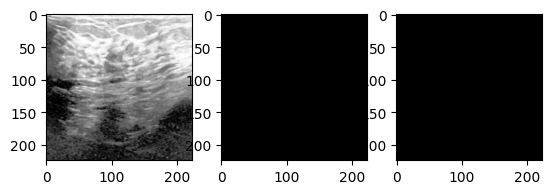

IOU: 1.0


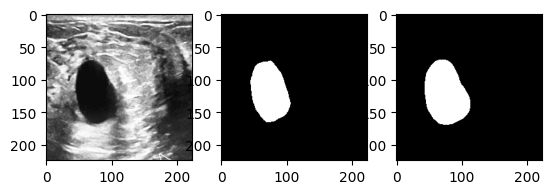

IOU: 0.8153430994602929


/usr/local/lib/python3.11/dist-packages/torch/_tensor.py:1077: RuntimeWarning: invalid value encountered in multiply
  return self.reciprocal() * other
/usr/local/lib/python3.11/dist-packages/torch/_tensor.py:1196: RuntimeWarning: invalid value encountered in cast
  return self.numpy().astype(dtype, copy=False)


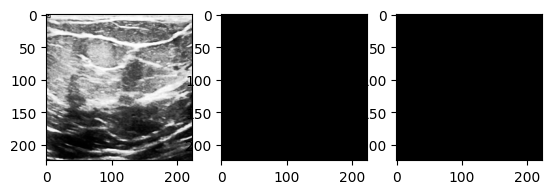

IOU: 1.0


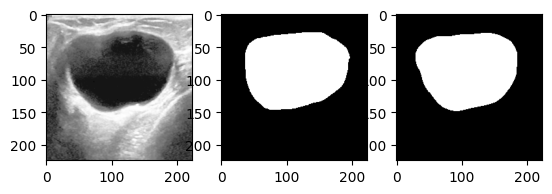

IOU: 0.9076093769587564


/usr/local/lib/python3.11/dist-packages/torch/_tensor.py:1077: RuntimeWarning: invalid value encountered in multiply
  return self.reciprocal() * other
/usr/local/lib/python3.11/dist-packages/torch/_tensor.py:1196: RuntimeWarning: invalid value encountered in cast
  return self.numpy().astype(dtype, copy=False)


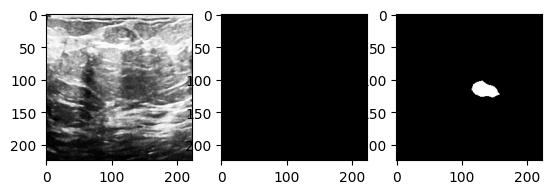

IOU: 0.0


/usr/local/lib/python3.11/dist-packages/sklearn/metrics/_classification.py:1565: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/usr/local/lib/python3.11/dist-packages/sklearn/metrics/_classification.py:1565: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/usr/local/lib/python3.11/dist-packages/sklearn/metrics/_classification.py:1565: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))


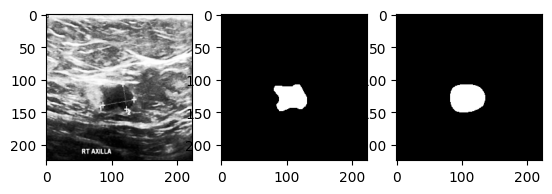

IOU: 0.7506234413965087


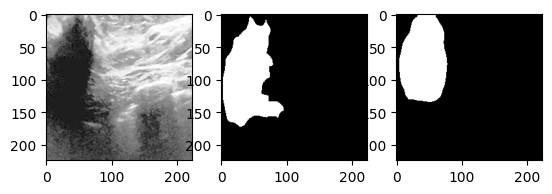

IOU: 0.6062781920279849


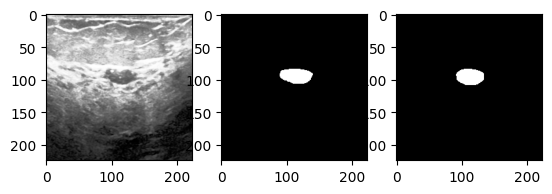

IOU: 0.7843719090009891


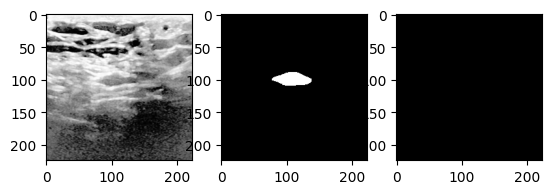

IOU: 0.0


/usr/local/lib/python3.11/dist-packages/sklearn/metrics/_classification.py:1565: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/usr/local/lib/python3.11/dist-packages/sklearn/metrics/_classification.py:1565: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/usr/local/lib/python3.11/dist-packages/sklearn/metrics/_classification.py:1565: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/usr/local/lib/python3.11/dist-packages/torch/_te

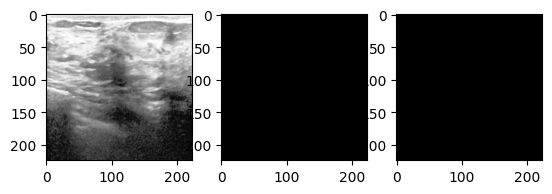

IOU: 1.0


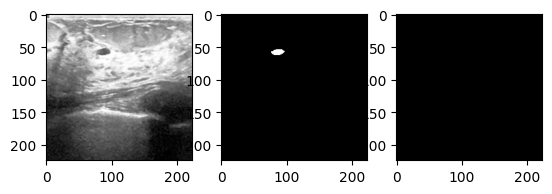

IOU: 0.0


/usr/local/lib/python3.11/dist-packages/sklearn/metrics/_classification.py:1565: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/usr/local/lib/python3.11/dist-packages/sklearn/metrics/_classification.py:1565: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/usr/local/lib/python3.11/dist-packages/sklearn/metrics/_classification.py:1565: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/usr/local/lib/python3.11/dist-packages/torch/_te

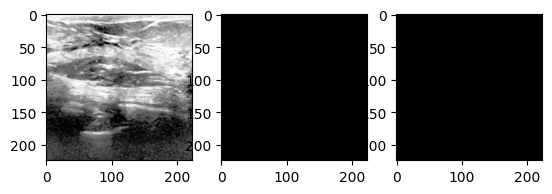

IOU: 1.0


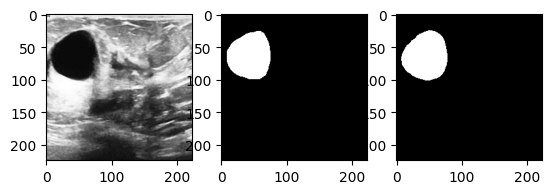

IOU: 0.9174815168137371


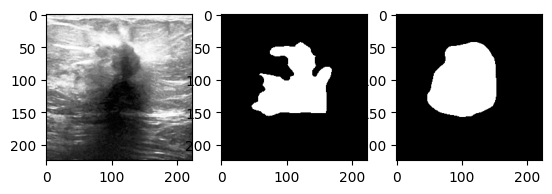

IOU: 0.6862520301901214


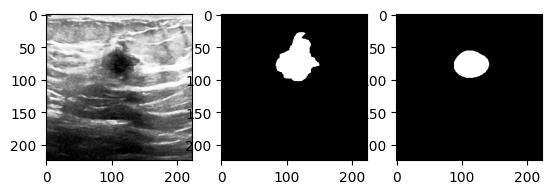

IOU: 0.60930395243092


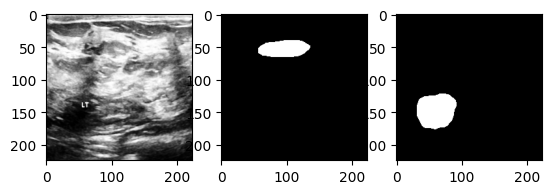

IOU: 0.0


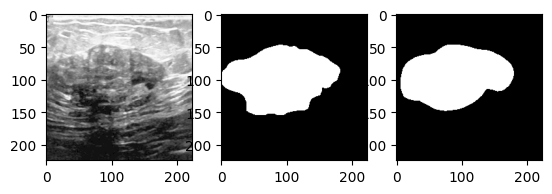

IOU: 0.8456518655128387


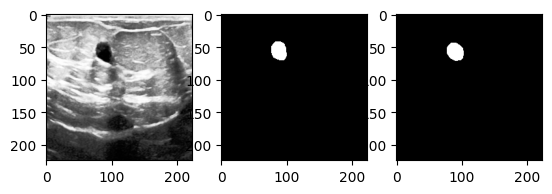

IOU: 0.7890625


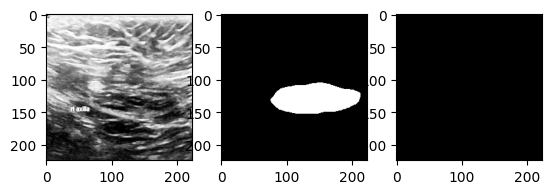

IOU: 0.0


/usr/local/lib/python3.11/dist-packages/sklearn/metrics/_classification.py:1565: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/usr/local/lib/python3.11/dist-packages/sklearn/metrics/_classification.py:1565: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/usr/local/lib/python3.11/dist-packages/sklearn/metrics/_classification.py:1565: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))


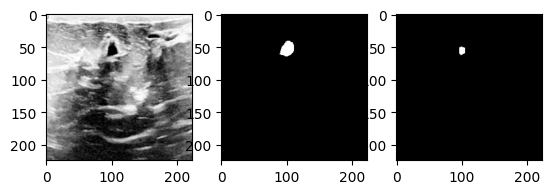

IOU: 0.25925925925925924


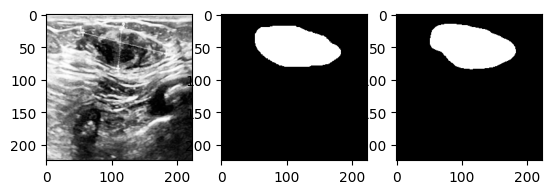

IOU: 0.899265785609398


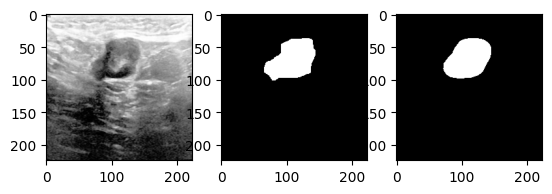

IOU: 0.8752705627705628


/usr/local/lib/python3.11/dist-packages/torch/_tensor.py:1077: RuntimeWarning: invalid value encountered in multiply
  return self.reciprocal() * other
/usr/local/lib/python3.11/dist-packages/torch/_tensor.py:1196: RuntimeWarning: invalid value encountered in cast
  return self.numpy().astype(dtype, copy=False)


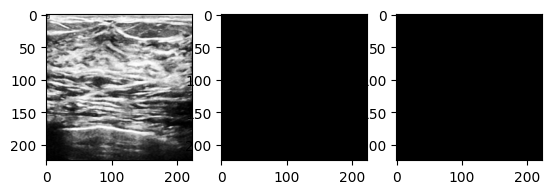

IOU: 1.0


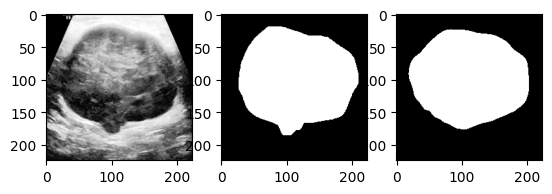

IOU: 0.9103460328556449


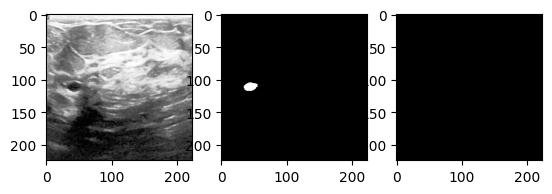

IOU: 0.0


/usr/local/lib/python3.11/dist-packages/sklearn/metrics/_classification.py:1565: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/usr/local/lib/python3.11/dist-packages/sklearn/metrics/_classification.py:1565: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/usr/local/lib/python3.11/dist-packages/sklearn/metrics/_classification.py:1565: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))


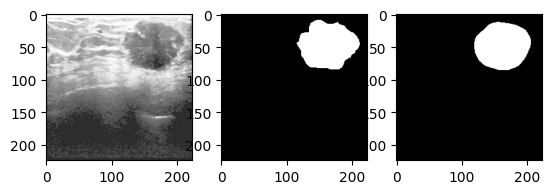

IOU: 0.9045573403063131


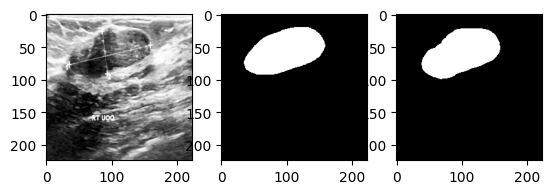

IOU: 0.875092169296564


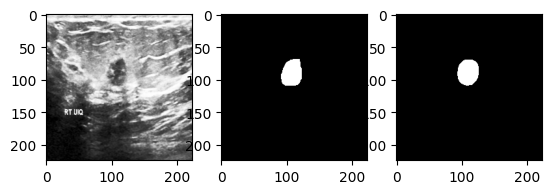

IOU: 0.8370118845500849


/usr/local/lib/python3.11/dist-packages/torch/_tensor.py:1077: RuntimeWarning: invalid value encountered in multiply
  return self.reciprocal() * other
/usr/local/lib/python3.11/dist-packages/torch/_tensor.py:1196: RuntimeWarning: invalid value encountered in cast
  return self.numpy().astype(dtype, copy=False)


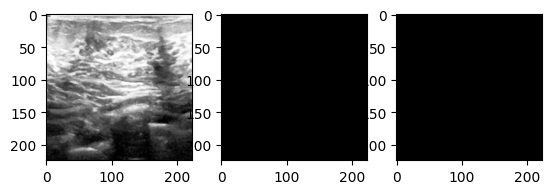

IOU: 1.0


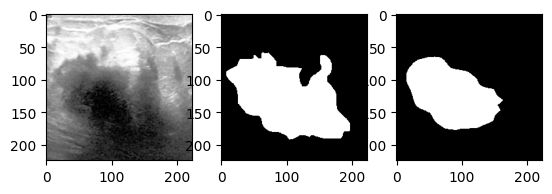

IOU: 0.6637877080986356


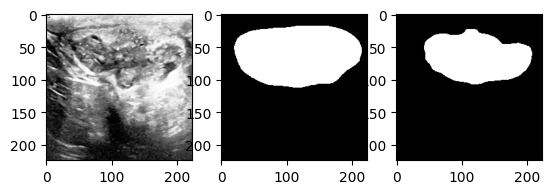

IOU: 0.6684214033451056


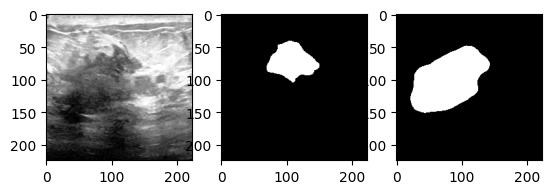

IOU: 0.30347915949018256


/usr/local/lib/python3.11/dist-packages/torch/_tensor.py:1077: RuntimeWarning: invalid value encountered in multiply
  return self.reciprocal() * other
/usr/local/lib/python3.11/dist-packages/torch/_tensor.py:1196: RuntimeWarning: invalid value encountered in cast
  return self.numpy().astype(dtype, copy=False)


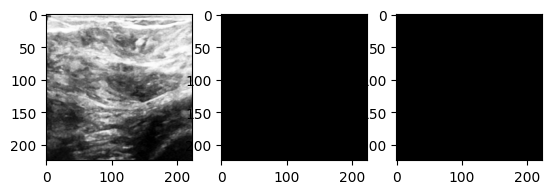

IOU: 1.0


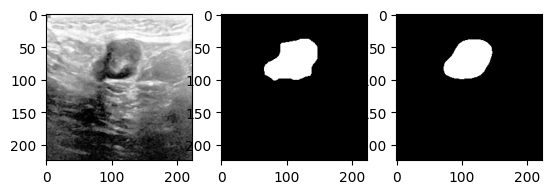

IOU: 0.8680189673340358


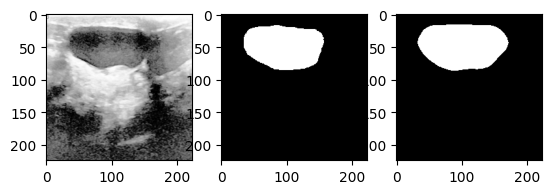

IOU: 0.8511038635223281


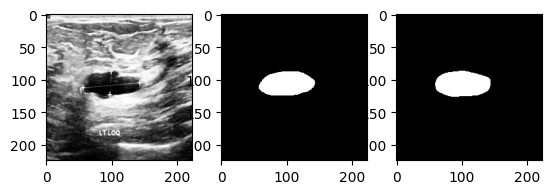

IOU: 0.8863879957127545


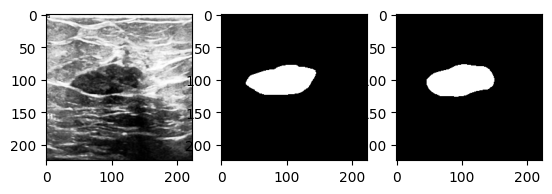

IOU: 0.8483214898309238


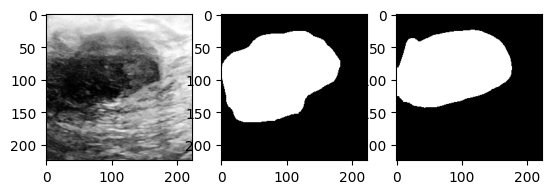

IOU: 0.7982252489294743


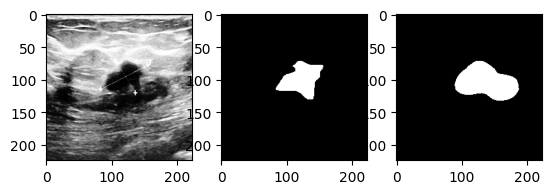

IOU: 0.5065648126044402


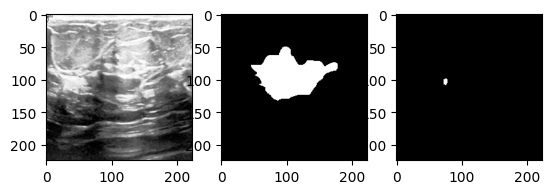

IOU: 0.008872651356993737


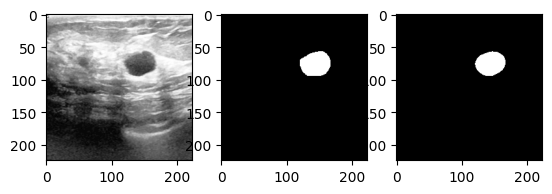

IOU: 0.919889502762431


/usr/local/lib/python3.11/dist-packages/torch/_tensor.py:1077: RuntimeWarning: invalid value encountered in multiply
  return self.reciprocal() * other
/usr/local/lib/python3.11/dist-packages/torch/_tensor.py:1196: RuntimeWarning: invalid value encountered in cast
  return self.numpy().astype(dtype, copy=False)


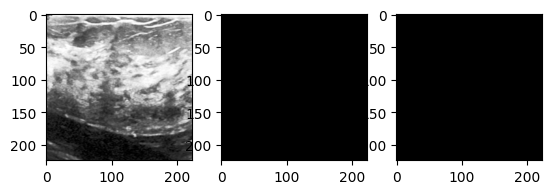

IOU: 1.0


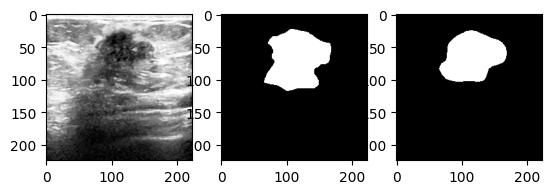

IOU: 0.781503054411138


/usr/local/lib/python3.11/dist-packages/torch/_tensor.py:1077: RuntimeWarning: invalid value encountered in multiply
  return self.reciprocal() * other
/usr/local/lib/python3.11/dist-packages/torch/_tensor.py:1196: RuntimeWarning: invalid value encountered in cast
  return self.numpy().astype(dtype, copy=False)


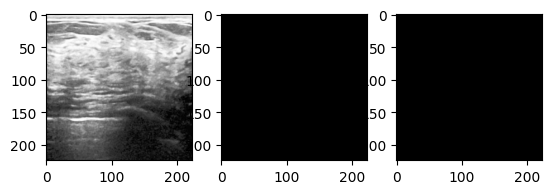

IOU: 1.0


/usr/local/lib/python3.11/dist-packages/torch/_tensor.py:1077: RuntimeWarning: invalid value encountered in multiply
  return self.reciprocal() * other
/usr/local/lib/python3.11/dist-packages/torch/_tensor.py:1196: RuntimeWarning: invalid value encountered in cast
  return self.numpy().astype(dtype, copy=False)


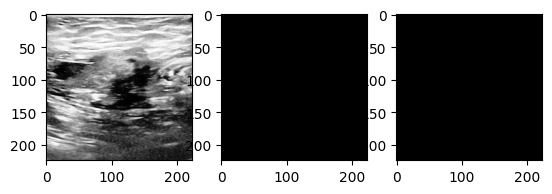

IOU: 1.0


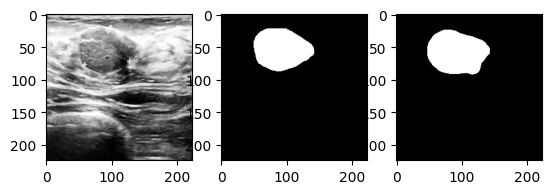

IOU: 0.8111466767087178


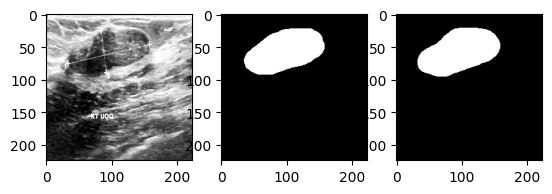

IOU: 0.9259596419359732


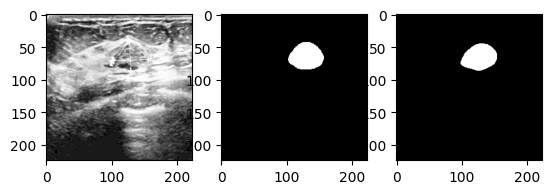

IOU: 0.844717182497332


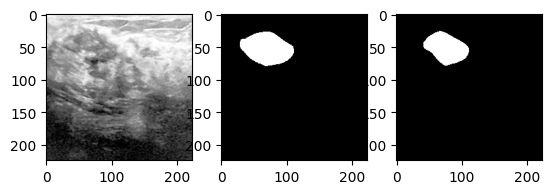

IOU: 0.7629796839729119


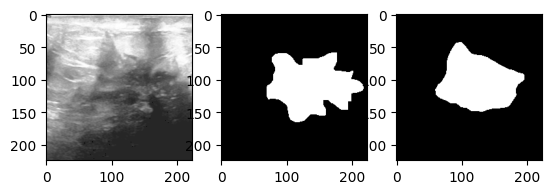

IOU: 0.6780730601724291


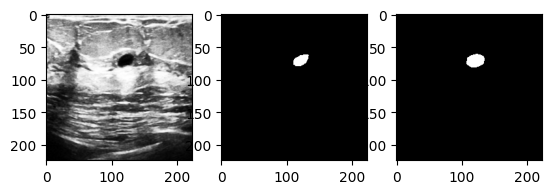

IOU: 0.6501079913606912


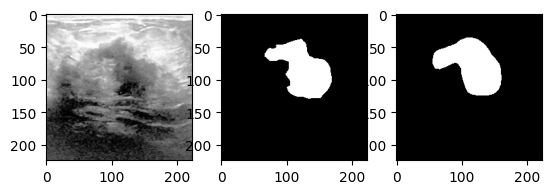

IOU: 0.7276042492468685


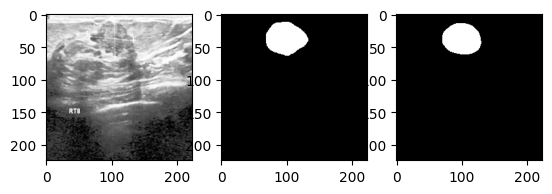

IOU: 0.8578088578088578


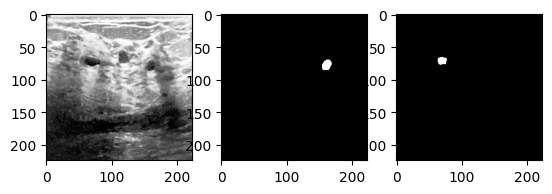

IOU: 0.0


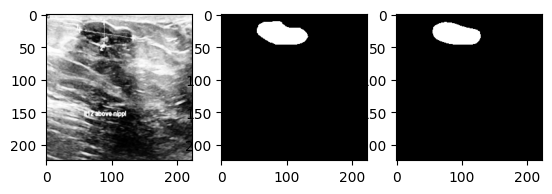

IOU: 0.901093675701379


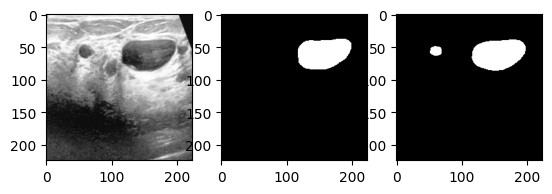

IOU: 0.8605324074074074


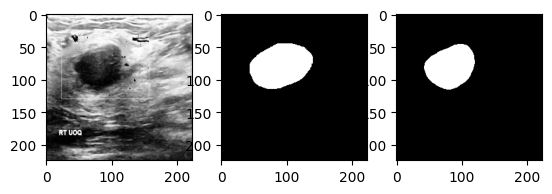

IOU: 0.7635372029606544


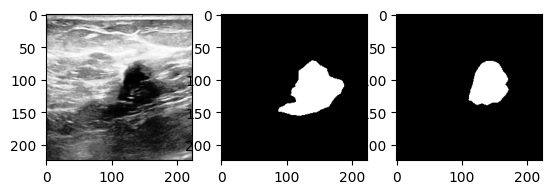

IOU: 0.6137743353569186


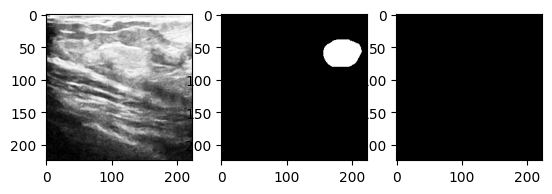

IOU: 0.0


/usr/local/lib/python3.11/dist-packages/sklearn/metrics/_classification.py:1565: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/usr/local/lib/python3.11/dist-packages/sklearn/metrics/_classification.py:1565: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/usr/local/lib/python3.11/dist-packages/sklearn/metrics/_classification.py:1565: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))


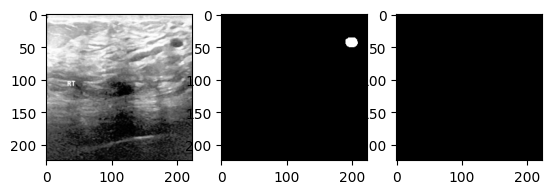

IOU: 0.0


/usr/local/lib/python3.11/dist-packages/sklearn/metrics/_classification.py:1565: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/usr/local/lib/python3.11/dist-packages/sklearn/metrics/_classification.py:1565: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/usr/local/lib/python3.11/dist-packages/sklearn/metrics/_classification.py:1565: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/usr/local/lib/python3.11/dist-packages/torch/_te

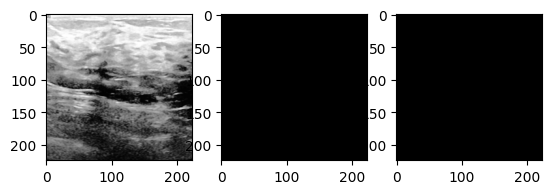

IOU: 1.0


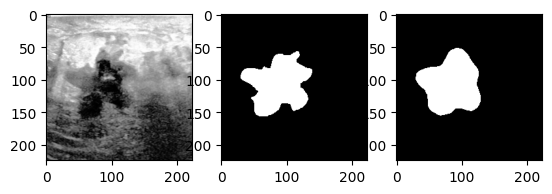

IOU: 0.8188346883468834


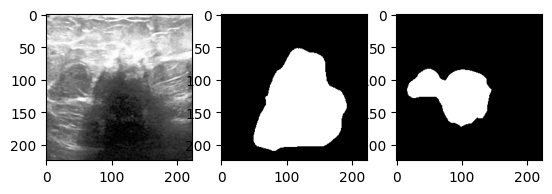

IOU: 0.2940730811818871


/usr/local/lib/python3.11/dist-packages/torch/_tensor.py:1077: RuntimeWarning: invalid value encountered in multiply
  return self.reciprocal() * other
/usr/local/lib/python3.11/dist-packages/torch/_tensor.py:1196: RuntimeWarning: invalid value encountered in cast
  return self.numpy().astype(dtype, copy=False)


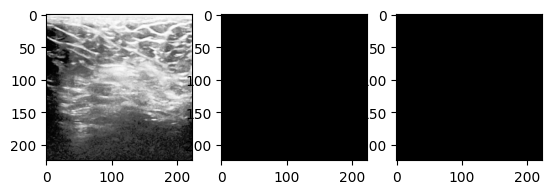

IOU: 1.0


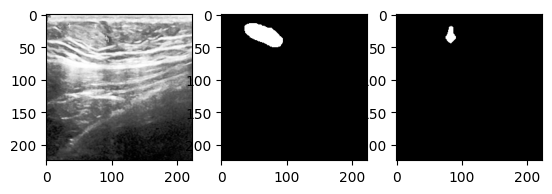

IOU: 0.1395184135977337


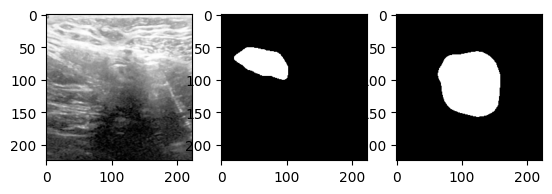

IOU: 0.11343600637280934


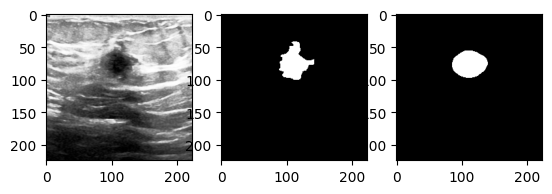

IOU: 0.6912125675012273


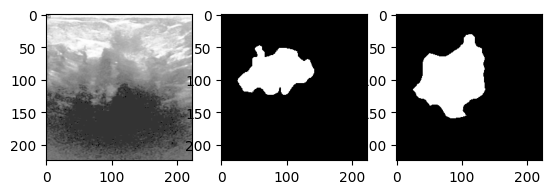

IOU: 0.5531961471103327


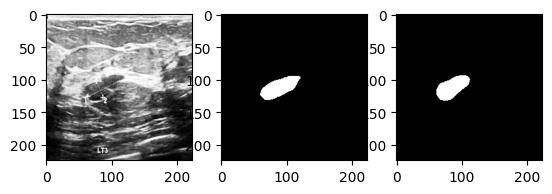

IOU: 0.7569775357385977


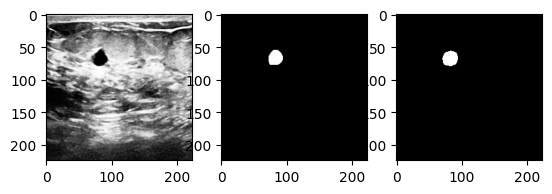

IOU: 0.8497854077253219


/usr/local/lib/python3.11/dist-packages/torch/_tensor.py:1077: RuntimeWarning: invalid value encountered in multiply
  return self.reciprocal() * other
/usr/local/lib/python3.11/dist-packages/torch/_tensor.py:1196: RuntimeWarning: invalid value encountered in cast
  return self.numpy().astype(dtype, copy=False)


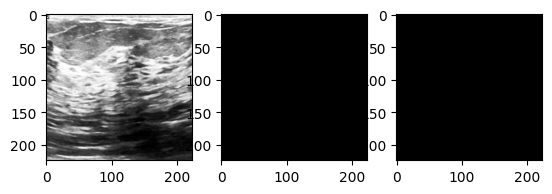

IOU: 1.0


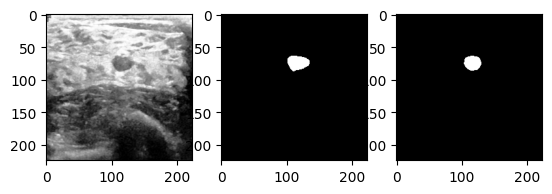

IOU: 0.7536231884057971


/usr/local/lib/python3.11/dist-packages/torch/_tensor.py:1077: RuntimeWarning: invalid value encountered in multiply
  return self.reciprocal() * other
/usr/local/lib/python3.11/dist-packages/torch/_tensor.py:1196: RuntimeWarning: invalid value encountered in cast
  return self.numpy().astype(dtype, copy=False)


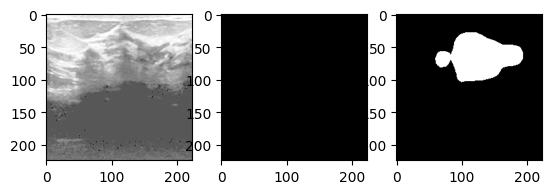

IOU: 0.0


/usr/local/lib/python3.11/dist-packages/sklearn/metrics/_classification.py:1565: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/usr/local/lib/python3.11/dist-packages/sklearn/metrics/_classification.py:1565: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/usr/local/lib/python3.11/dist-packages/sklearn/metrics/_classification.py:1565: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/usr/local/lib/python3.11/dist-packages/torch/_tensor.py:1077: RuntimeWar

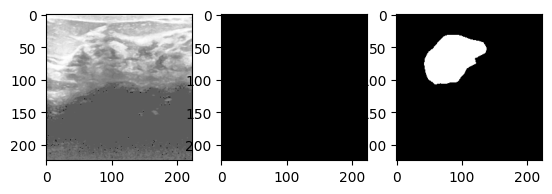

IOU: 0.0


/usr/local/lib/python3.11/dist-packages/sklearn/metrics/_classification.py:1565: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/usr/local/lib/python3.11/dist-packages/sklearn/metrics/_classification.py:1565: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/usr/local/lib/python3.11/dist-packages/sklearn/metrics/_classification.py:1565: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))


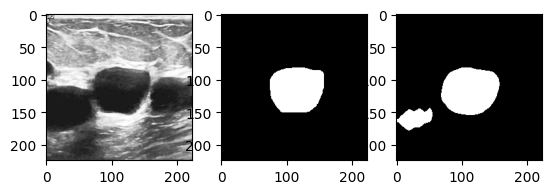

IOU: 0.7270509301616347


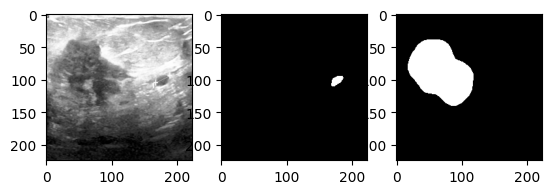

IOU: 0.0


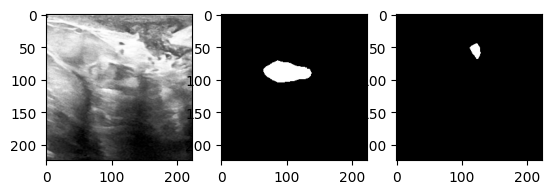

IOU: 0.0


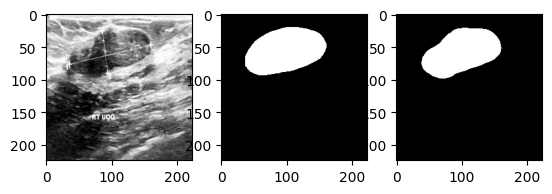

IOU: 0.8829650748396294


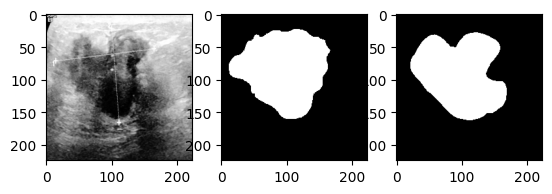

IOU: 0.7843174724504746


/usr/local/lib/python3.11/dist-packages/torch/_tensor.py:1077: RuntimeWarning: invalid value encountered in multiply
  return self.reciprocal() * other
/usr/local/lib/python3.11/dist-packages/torch/_tensor.py:1196: RuntimeWarning: invalid value encountered in cast
  return self.numpy().astype(dtype, copy=False)


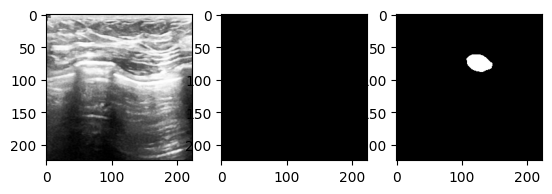

IOU: 0.0


/usr/local/lib/python3.11/dist-packages/sklearn/metrics/_classification.py:1565: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/usr/local/lib/python3.11/dist-packages/sklearn/metrics/_classification.py:1565: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/usr/local/lib/python3.11/dist-packages/sklearn/metrics/_classification.py:1565: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))


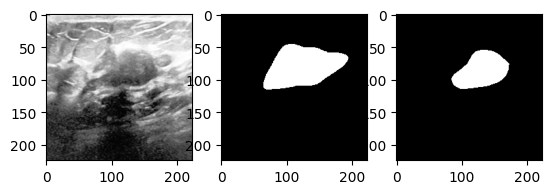

IOU: 0.5526443474041728


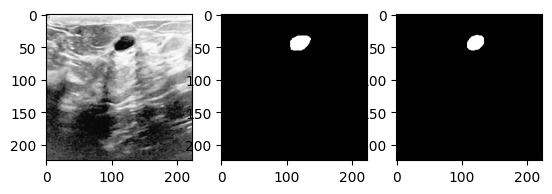

IOU: 0.8223350253807107


/usr/local/lib/python3.11/dist-packages/torch/_tensor.py:1077: RuntimeWarning: invalid value encountered in multiply
  return self.reciprocal() * other
/usr/local/lib/python3.11/dist-packages/torch/_tensor.py:1196: RuntimeWarning: invalid value encountered in cast
  return self.numpy().astype(dtype, copy=False)


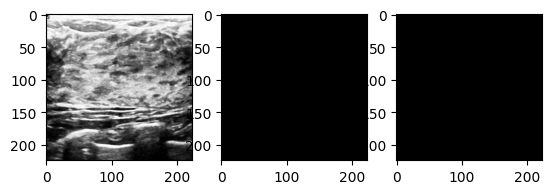

IOU: 1.0


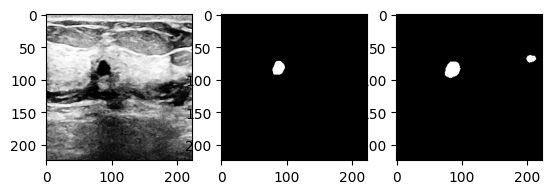

IOU: 0.5109983079526227


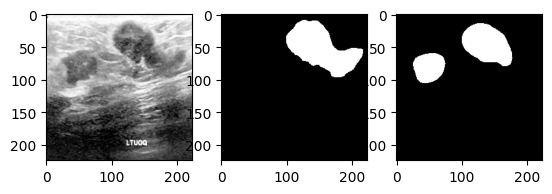

IOU: 0.48204778156996586


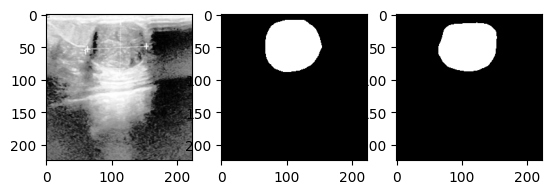

IOU: 0.8974445760704011


/usr/local/lib/python3.11/dist-packages/torch/_tensor.py:1077: RuntimeWarning: invalid value encountered in multiply
  return self.reciprocal() * other
/usr/local/lib/python3.11/dist-packages/torch/_tensor.py:1196: RuntimeWarning: invalid value encountered in cast
  return self.numpy().astype(dtype, copy=False)


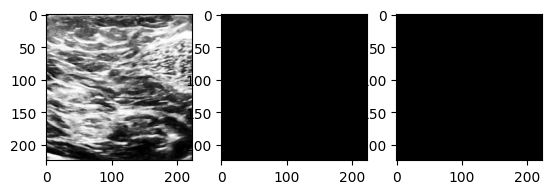

IOU: 1.0


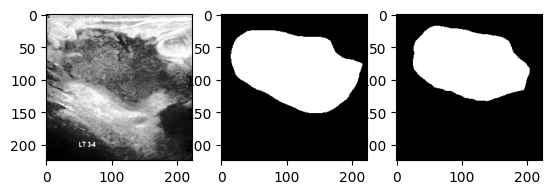

IOU: 0.7715146299483648


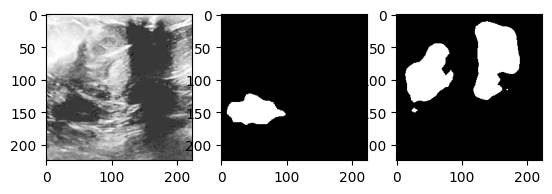

IOU: 0.01809598741148702


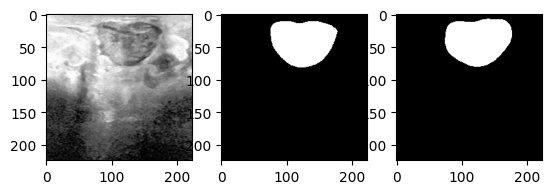

IOU: 0.9090909090909091


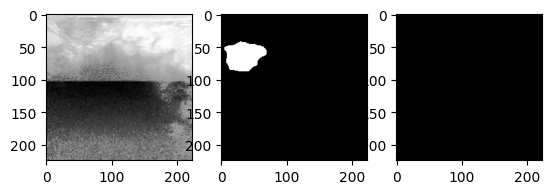

IOU: 0.0


/usr/local/lib/python3.11/dist-packages/sklearn/metrics/_classification.py:1565: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/usr/local/lib/python3.11/dist-packages/sklearn/metrics/_classification.py:1565: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/usr/local/lib/python3.11/dist-packages/sklearn/metrics/_classification.py:1565: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))


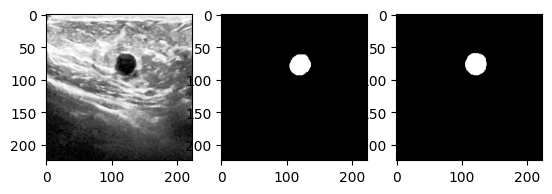

IOU: 0.8517722878625135


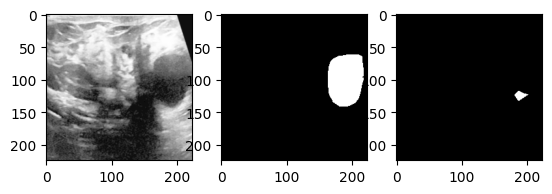

IOU: 0.04547872340425532


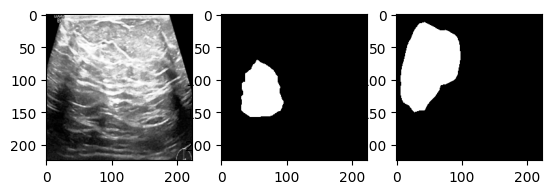

IOU: 0.22136687945925648


/usr/local/lib/python3.11/dist-packages/torch/_tensor.py:1077: RuntimeWarning: invalid value encountered in multiply
  return self.reciprocal() * other
/usr/local/lib/python3.11/dist-packages/torch/_tensor.py:1196: RuntimeWarning: invalid value encountered in cast
  return self.numpy().astype(dtype, copy=False)


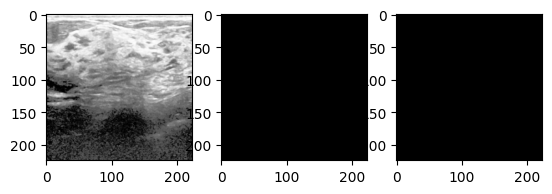

IOU: 1.0


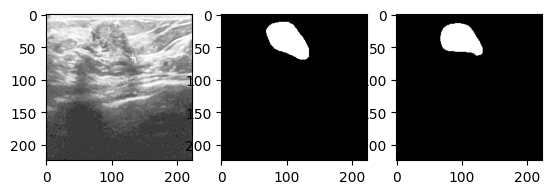

IOU: 0.8014925373134328


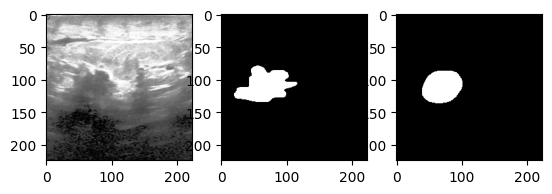

IOU: 0.7022168963451169


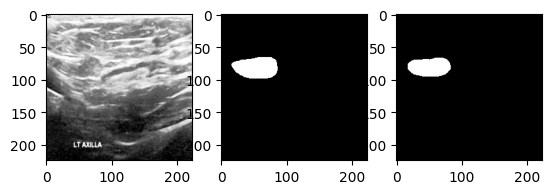

IOU: 0.8190426091530774


/usr/local/lib/python3.11/dist-packages/torch/_tensor.py:1077: RuntimeWarning: invalid value encountered in multiply
  return self.reciprocal() * other
/usr/local/lib/python3.11/dist-packages/torch/_tensor.py:1196: RuntimeWarning: invalid value encountered in cast
  return self.numpy().astype(dtype, copy=False)


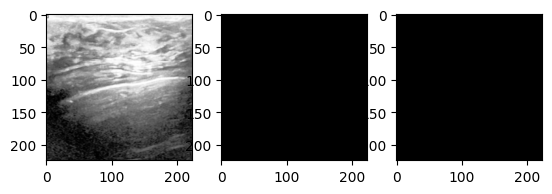

IOU: 1.0


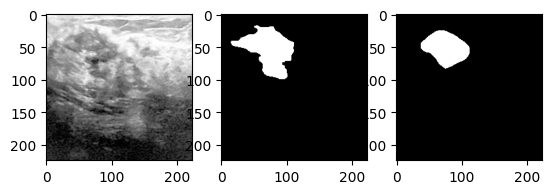

IOU: 0.6618322455885908


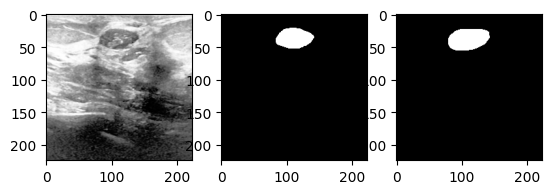

IOU: 0.7811085972850679


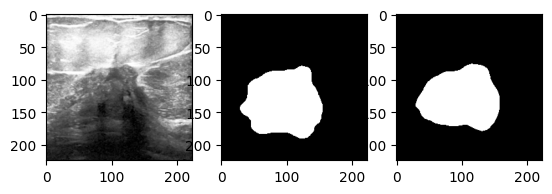

IOU: 0.8147270573225189


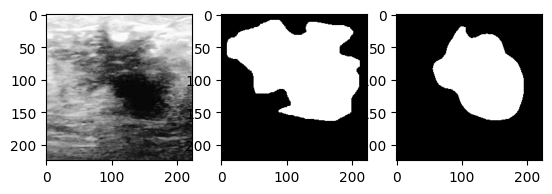

IOU: 0.6011365736462762


/usr/local/lib/python3.11/dist-packages/torch/_tensor.py:1077: RuntimeWarning: invalid value encountered in multiply
  return self.reciprocal() * other
/usr/local/lib/python3.11/dist-packages/torch/_tensor.py:1196: RuntimeWarning: invalid value encountered in cast
  return self.numpy().astype(dtype, copy=False)


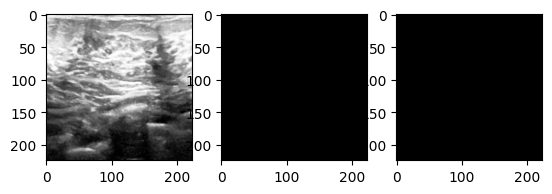

IOU: 1.0


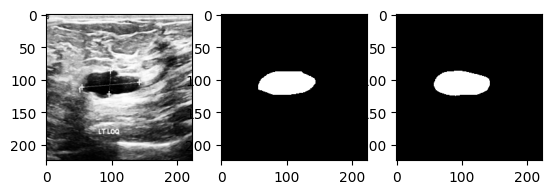

IOU: 0.900990099009901


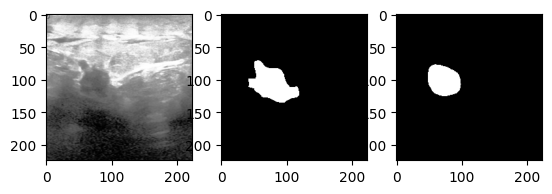

IOU: 0.6363636363636364


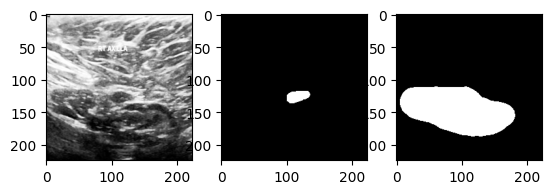

IOU: 0.04446041688058322


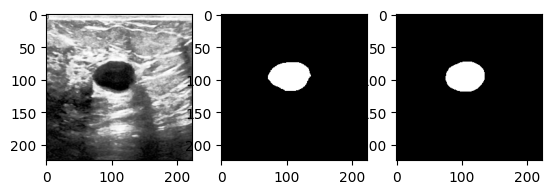

IOU: 0.9063444108761329


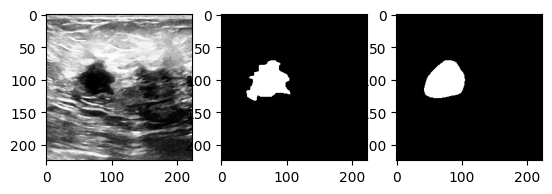

IOU: 0.8084449021627188


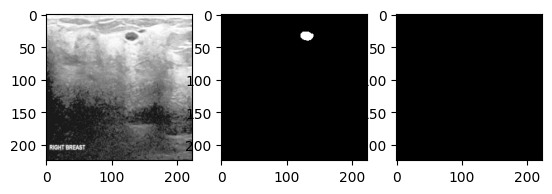

IOU: 0.0


/usr/local/lib/python3.11/dist-packages/sklearn/metrics/_classification.py:1565: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/usr/local/lib/python3.11/dist-packages/sklearn/metrics/_classification.py:1565: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/usr/local/lib/python3.11/dist-packages/sklearn/metrics/_classification.py:1565: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))


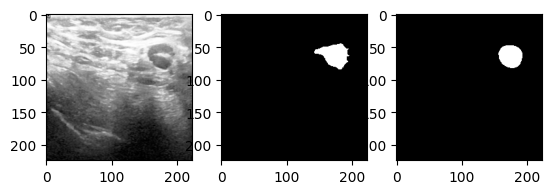

IOU: 0.7776911076443058


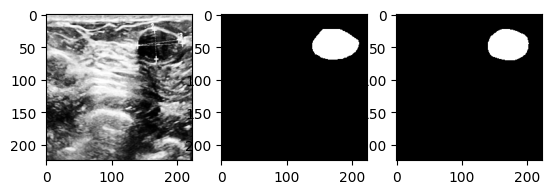

IOU: 0.8855646970830217


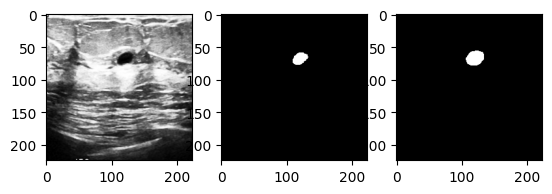

IOU: 0.6495049504950495


/usr/local/lib/python3.11/dist-packages/torch/_tensor.py:1077: RuntimeWarning: invalid value encountered in multiply
  return self.reciprocal() * other
/usr/local/lib/python3.11/dist-packages/torch/_tensor.py:1196: RuntimeWarning: invalid value encountered in cast
  return self.numpy().astype(dtype, copy=False)


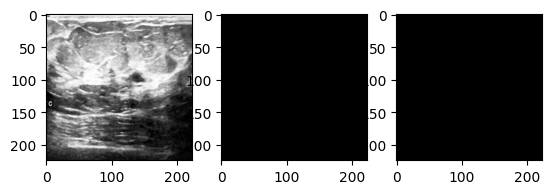

IOU: 1.0


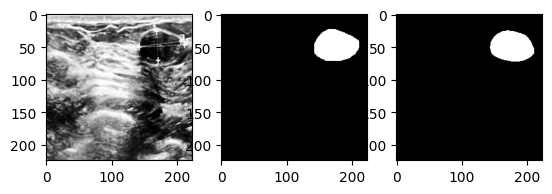

IOU: 0.8709560159941839


/usr/local/lib/python3.11/dist-packages/torch/_tensor.py:1077: RuntimeWarning: invalid value encountered in multiply
  return self.reciprocal() * other
/usr/local/lib/python3.11/dist-packages/torch/_tensor.py:1196: RuntimeWarning: invalid value encountered in cast
  return self.numpy().astype(dtype, copy=False)


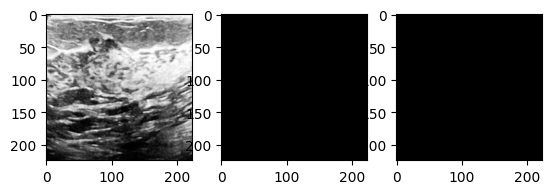

IOU: 1.0


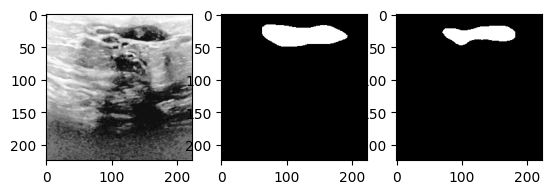

IOU: 0.6400709219858156


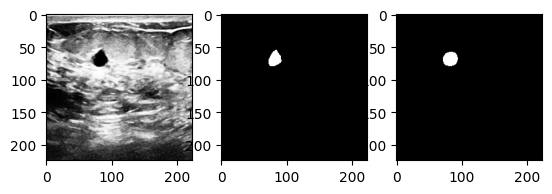

IOU: 0.7523148148148148


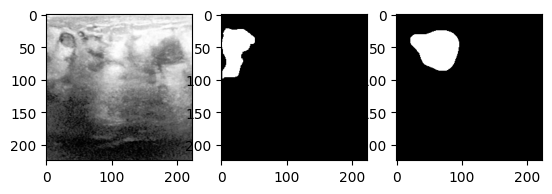

IOU: 0.1095166163141994


/usr/local/lib/python3.11/dist-packages/torch/_tensor.py:1077: RuntimeWarning: invalid value encountered in multiply
  return self.reciprocal() * other
/usr/local/lib/python3.11/dist-packages/torch/_tensor.py:1196: RuntimeWarning: invalid value encountered in cast
  return self.numpy().astype(dtype, copy=False)


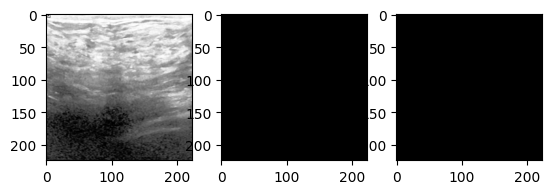

IOU: 1.0


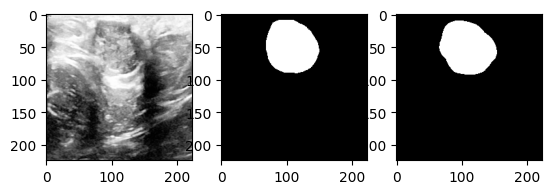

IOU: 0.9076651982378855


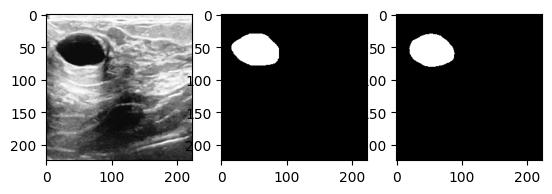

IOU: 0.919326552086987


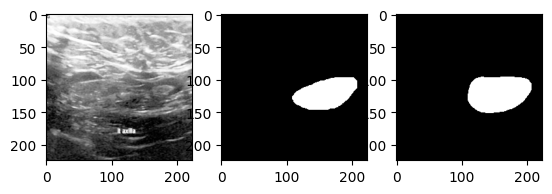

IOU: 0.7759345277593452


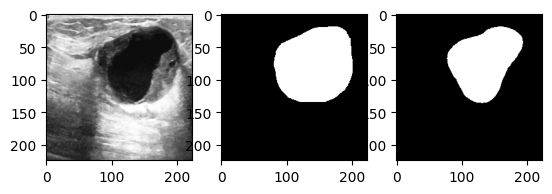

IOU: 0.7557073676928399


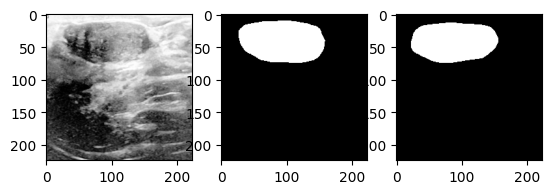

IOU: 0.8455198085615527


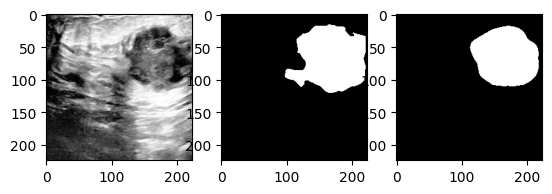

IOU: 0.7852248394004283


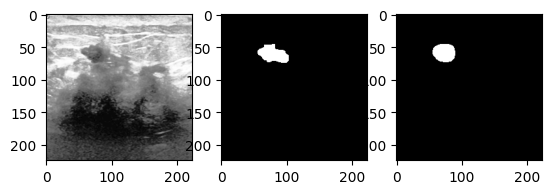

IOU: 0.6480075901328273


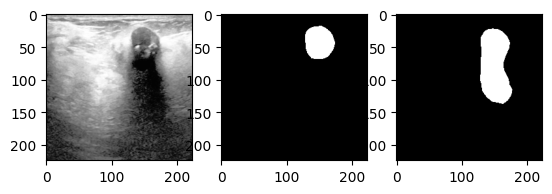

IOU: 0.3660402097902098


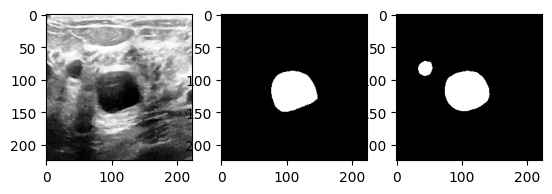

IOU: 0.8195889368180664


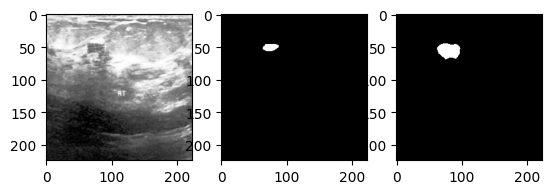

IOU: 0.3183856502242152


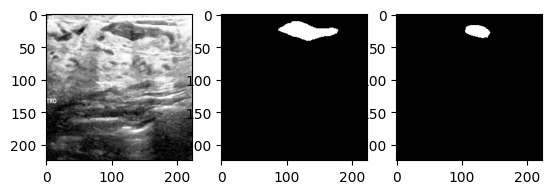

IOU: 0.3697916666666667


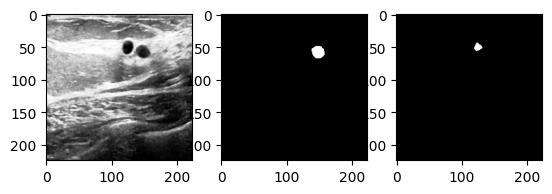

IOU: 0.0


/usr/local/lib/python3.11/dist-packages/torch/_tensor.py:1077: RuntimeWarning: invalid value encountered in multiply
  return self.reciprocal() * other
/usr/local/lib/python3.11/dist-packages/torch/_tensor.py:1196: RuntimeWarning: invalid value encountered in cast
  return self.numpy().astype(dtype, copy=False)


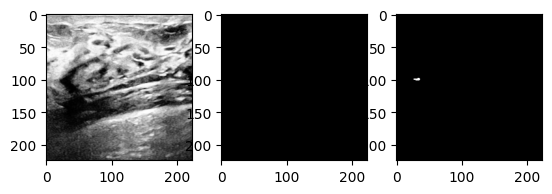

IOU: 0.0


/usr/local/lib/python3.11/dist-packages/sklearn/metrics/_classification.py:1565: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/usr/local/lib/python3.11/dist-packages/sklearn/metrics/_classification.py:1565: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/usr/local/lib/python3.11/dist-packages/sklearn/metrics/_classification.py:1565: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))


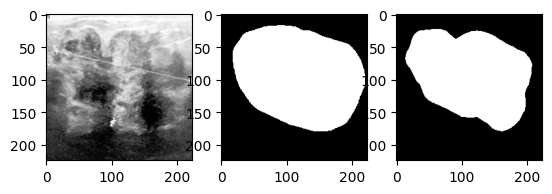

IOU: 0.836782152851681


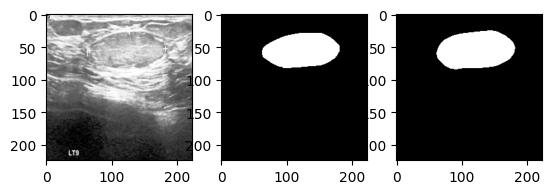

IOU: 0.8883167613636364


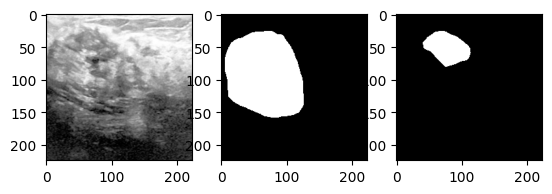

IOU: 0.19496758258721827
Average IOU: 0.6537672227377401
The Average Classification Report
              precision    recall  f1-score       support
0              0.977081  0.984203  0.979902  46174.185897
1              0.735255  0.680261  0.676434   4693.857143
accuracy       0.966018  0.966018  0.966018      0.966018
macro avg      0.875684  0.855802  0.852021  50176.000000
weighted avg   0.972199  0.966018  0.966075  50176.000000


In [ ]:
#written by Angel
#Print the image, mask, and prediction for each index for the second model
iou_avg = []
classification_avg = []

for i, (image, label_tr) in enumerate(test_dataset2):
    image = image.unsqueeze(0).to(device)
    model2.eval()

    with torch.no_grad():
        output = model2(image)['out']
        segmentation_result = torch.argmax(output, dim=1)

    segmentation_result = segmentation_result.squeeze(0).cpu().numpy()
    segmentation_pre = cv2.resize(segmentation_result, (label_tr.shape[1], label_tr.shape[0]), interpolation=cv2.INTER_NEAREST)


    pic = np.uint8(label_tr.cpu().numpy() / label_tr.max())



    plt.subplot(1, 3, 1)
    plt.imshow(image.cpu().squeeze(0).permute(1, 2, 0))

    plt.subplot(1, 3, 2)
    plt.imshow(pic, cmap="gray")

    plt.subplot(1, 3, 3)
    plt.imshow(segmentation_pre, cmap="gray")

    plt.show()

    iou = jaccard_score(pic.flatten(), segmentation_pre.flatten(),zero_division=1)
    iou_avg.append(iou)


    print("IOU: " + str(iou))



    IndReport = classification_report(pic.flatten(), segmentation_pre.flatten(), output_dict=True)
    classification_avg.append(IndReport)

classification_flatten = []

for IndReport in classification_avg:
    df = pd.DataFrame(IndReport).T
    classification_flatten.append(df)

classification_comb = pd.concat(classification_flatten)
classification_avgRT = classification_comb.groupby(classification_comb.index).mean()

iou_avgRt = np.mean(iou_avg)
print("Average IOU: " + str(iou_avgRt))


print("The Average Classification Report")
print(classification_avgRT)





In [ ]:
#written by Angel
#going through test_dataset2
for i, (image, label_tr) in enumerate(test_dataset2):

#converts it to numpy array then watershed method is applied
    image_input = image.unsqueeze(0).to(device)
    model2.eval()
    with torch.no_grad():
        output = model2(image_input)['out']
        segmentation_result = torch.argmax(output, dim=1).squeeze(0).cpu().numpy()


    image_num = image.squeeze(0).cpu().numpy().transpose(1, 2, 0)
    image_num = np.uint8(image_num * 255)

    thresh = np.uint8(segmentation_result * 255)

    dist_transform = cv2.distanceTransform(thresh, cv2.DIST_L2, 3)

    ret, sure_fg = cv2.threshold(dist_transform, 0.5 * dist_transform.max(), 255, 0)
    sure_fg = np.uint8(sure_fg)

    unsure = cv2.subtract(thresh, sure_fg)

    ret, index = cv2.connectedComponents(sure_fg)

    index2 = index + 1
    index2[unsure == 255] = 0

    result = cv2.watershed(image_num, index2)

    image_num[result == -1] = [0, 0, 255]

#The results are printed
    plt.figure(figsize=(20, 10))
    plt.subplot(1, 7, 1)
    plt.title('Distance')
    plt.imshow(dist_transform, cmap='gray')


    plt.subplot(1, 7, 2)
    plt.title('foreground')
    plt.imshow(sure_fg, cmap='gray')


    plt.subplot(1, 7, 3)
    plt.title('Unsure')
    plt.imshow(unsure, cmap='gray')



    plt.subplot(1, 7, 4)
    plt.title('Index')
    plt.imshow(index, cmap='gray')


    plt.subplot(1, 7, 5)
    plt.title('index2')
    plt.imshow(index2, cmap='gray')


    plt.subplot(1, 7, 6)
    plt.title(' Result')
    plt.imshow(result, cmap='gray')


    plt.subplot(1, 7, 7)
    plt.title('result')
    plt.imshow(cv2.cvtColor(image_num, cv2.COLOR_BGR2RGB))


    plt.show()